### LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

## Assignment template

### Scenario
You are a data analyst working for Turtle Games, a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points (Week 1)
- how useful are remuneration and spending scores data (Week 2)
- can social data (e.g. customer reviews) be used in marketing campaigns (Week 3)
- what is the impact on sales per product (Week 4)
- the reliability of the data (e.g. normal distribution, Skewness, Kurtosis) (Week 5)
- if there is any possible relationship(s) in sales between North America, Europe, and global sales (Week 6).

# Week 1 assignment: Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

## Instructions
1. Load and explore the data.
    1. Create a new DataFrame (e.g. reviews).
    2. Sense-check the DataFrame.
    3. Determine if there are any missing values in the DataFrame.
    4. Create a summary of the descriptive statistics.
2. Remove redundant columns (`language` and `platform`).
3. Change column headings to names that are easier to reference (e.g. `remuneration` and `spending_score`).
4. Save a copy of the clean DataFrame as a CSV file. Import the file to sense-check.
5. Use linear regression and the `statsmodels` functions to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.
6. Include your insights and observations.

## 1. Load and explore the data

In [1]:
# Import the necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [2]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [3]:
# Any missing values?
reviews.isnull().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

In [4]:
# Explore the data.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


In [5]:
# Descriptive statistics.
reviews.describe()

,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Drop columns

In [6]:
# Drop unnecessary columns.
reviews_1 = reviews.drop(columns=['language', 'platform'])

# View column names.
reviews_1.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

## 3. Rename columns

In [7]:
# Rename the column headers.
reviews_final = reviews_1.rename(
    columns={
        'remuneration (k£)': 'remuneration',
        'spending_score (1-100)': 'spending_score',
        'product': 'product_code'
    })

# View column names.
reviews_final.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product_code', 'review', 'summary'],
      dtype='object')

## 4. Save the DataFrame as a CSV file

In [8]:
# Create a CSV file as output.
reviews_final.to_csv('reviews_final.csv')

In [9]:
# Import new CSV file with Pandas.
reviews_fnl = pd.read_csv('reviews_final.csv', index_col=0)

# View DataFrame.
reviews_fnl.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [10]:
# Sense-check the DataFrame (e.g. shape, metadata)
print(reviews_fnl.shape)
print(reviews_fnl.info())

(2000, 9)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product_code    2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 156.2+ KB
None


In [11]:
# Any missing values?
reviews_fnl.isnull().sum()

gender            0
age               0
remuneration      0
spending_score    0
loyalty_points    0
education         0
product_code      0
review            0
summary           0
dtype: int64

## 5. Linear regression

### 5a) spending score vs loyalty points

In [12]:
# Independent variable.
x_sslp = reviews_fnl['spending_score']

# Dependent variable.
y_sslp = reviews_fnl['loyalty_points']

# OLS model and summary.
f_sslp = 'y_sslp ~ x_sslp'
test_sslp = ols(f_sslp, data=reviews_fnl).fit()
test_sslp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 y_sslp   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):          2.92e-263
Time:                        14:53:37   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
x_sslp        33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [13]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_sslp.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_sslp.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_sslp.predict())

Estimated parameters:
 Intercept   -75.052663
x_sslp       33.061693
dtype: float64

Standard errors:
 Intercept    45.930554
x_sslp        0.814419
dtype: float64

Predicted values:
 [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [14]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_sslp = 33.061693
const_sslp = (-75.052663)
y_pred_sslp = const_sslp + x_coef_sslp * x_sslp

# View the output.
y_pred_sslp

0       1214.353364
1       2602.944470
2        123.317495
3       2470.697698
4       1247.415057
           ...     
1995    2206.204154
1996     189.440881
1997    2933.561400
1998     453.934425
1999     189.440881
Name: spending_score, Length: 2000, dtype: float64

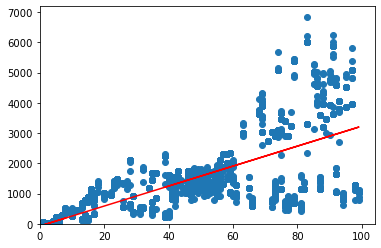

In [15]:
# Plot the graph with a regression line.
plt.scatter(x_sslp, y_sslp)

plt.plot(x_sslp, y_pred_sslp, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [16]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp = sms.het_breuschpagan(test_sslp.resid, test_sslp.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp, test_sslp)))

# LM Test p-value = 5.042699614942239e-139 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 629.9823360215912, 'LM Test p-value': 5.042699614942239e-139, 'F-stat': 918.7507142907729, 'F-test p-value': 2.3037887924497478e-166}


**Reduce heteroscedasticity:**

**a) perform a log10 transformation on the dependent variable (y = loyalty_points):**

In [17]:
# Perform a log10 transformation on the dependent variable (y = loyalty_points) to reduce
# heteroscedasticity.

# Add a column to the DataFrame with log10 of the dependent variable (y).
reviews_fnl['loyalty_points_log10'] = np.log10(reviews_fnl['loyalty_points'])

# View DataFrame.
reviews_fnl.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary,loyalty_points_log10
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,2.322219
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,2.719331
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",1.602060
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars,2.749736
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap,2.563481


In [18]:
# Independent variable.
x_sslp = reviews_fnl['spending_score']

# Dependent variable.
y_sslp_log10 = reviews_fnl['loyalty_points_log10']

# OLS model and summary.
f_sslp_log10 = 'y_sslp_log10 ~ x_sslp'
test_sslp_log10 = ols(f_sslp_log10, data=reviews_fnl).fit()
test_sslp_log10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           y_sslp_log10   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     2153.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):          1.44e-319
Time:                        14:53:37   Log-Likelihood:                -478.62
No. Observations:                2000   AIC:                             961.2
Df Residuals:                    1998   BIC:                             972.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.4207      0.015    162.833      0.000       2.392       2.450
x_sslp         0.0122      0.000     46.400      0.000       0.012       0.013
==============================================================================
Omnibus:                      247.764   Durbin-Watson:                   0.562
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              344.804
Skew:                          -1.000   Prob(JB):                     1.34e-75
Kurtosis:                       3.366   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [19]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_sslp_log10 = 0.0122
const_sslp_log10 = 2.4207
y_pred_sslp_log10 = const_sslp_log10 + x_coef_sslp_log10 * x_sslp

# View the output.
y_pred_sslp_log10

0       2.8965
1       3.4089
2       2.4939
3       3.3601
4       2.9087
         ...  
1995    3.2625
1996    2.5183
1997    3.5309
1998    2.6159
1999    2.5183
Name: spending_score, Length: 2000, dtype: float64

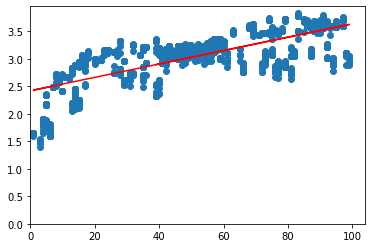

In [20]:
# Plot the graph with a regression line.
plt.scatter(x_sslp, y_sslp_log10)

plt.plot(x_sslp, y_pred_sslp_log10, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [21]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_log10 = sms.het_breuschpagan(test_sslp_log10.resid,
                                       test_sslp_log10.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_log10 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_log10, test_sslp_log10)))

# LM Test p-value = 6.900660585139142e-22 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 92.45116941985287, 'LM Test p-value': 6.900660585139142e-22, 'F-stat': 96.83497142491899, 'F-test p-value': 2.404357715981202e-22}


**b) fit Weighted Least Squares (WLS) model; use weight = 1/(y_pred_sslp squared):**

In [22]:
# Fit Weighted Least Squares (WLS) model.
# Define weights to use (= 1/(y_pred_sslp squared)).
wt = 1 / ols(f_sslp, data=reviews_fnl).fit().fittedvalues**2

X = sm.add_constant(x_sslp)

test_sslp_wls = sm.WLS(y_sslp, X, weights=wt).fit()

# View WLS summary.
print(test_sslp_wls.summary())

                            WLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.738
Model:                            WLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     5635.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:38   Log-Likelihood:                -15853.
No. Observations:                2000   AIC:                         3.171e+04
Df Residuals:                    1998   BIC:                         3.172e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -41.7654      3.140    -13.

In [23]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_wls = sms.het_breuschpagan(test_sslp_wls.resid,
                                     test_sslp_wls.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_wls = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_wls, test_sslp_wls)))

# LM Test p-value = 2.3172764822918004e-140 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 636.1329189315552, 'LM Test p-value': 2.3172764822918004e-140, 'F-stat': 931.9042813391748, 'F-test p-value': 2.5596122299055524e-168}


**c) fit Weighted Least Squares (WLS) model; use weight = 1/(x_sslp squared):**

In [24]:
# Fit Weighted Least Squares (WLS) Model.
# Define weights to use (= 1/(x_sslp squared)).
x_sslp_wt = reviews_fnl['spending_score']**2
wt = 1 / x_sslp_wt

X = sm.add_constant(x_sslp)

test_sslp_wls1 = sm.WLS(y_sslp, X, weights=wt).fit()

# View WLS summary.
print(test_sslp_wls1.summary())

                            WLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.758
Model:                            WLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     6269.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:38   Log-Likelihood:                -15770.
No. Observations:                2000   AIC:                         3.154e+04
Df Residuals:                    1998   BIC:                         3.156e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              3.1995      3.683      0.

In [25]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_wls1 = sms.het_breuschpagan(test_sslp_wls1.resid,
                                      test_sslp_wls1.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_wls1 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_wls1, test_sslp_wls1)))

# LM Test p-value = 1.3336790126857622e-138 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 628.0402441854413, 'LM Test p-value': 1.3336790126857622e-138, 'F-stat': 914.6218776202358, 'F-test p-value': 9.499513579477449e-166}


**d) split reviews_fnl DataFrame by selecting rows with spending score values <= 60 and fit OLS model again:**

In [26]:
# Select rows with spending score values <= 60 from reviews_fnl DataFrame.
reviews_fnl_60 = reviews_fnl[reviews_fnl['spending_score'] <= 60].reset_index()

# View DataFrame (1367 entries included out of 2000 entries in reviews_fnl DataFrame).
reviews_fnl_60.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1367 entries, 0 to 1366
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 1367 non-null   int64  
 1   gender                1367 non-null   object 
 2   age                   1367 non-null   int64  
 3   remuneration          1367 non-null   float64
 4   spending_score        1367 non-null   int64  
 5   loyalty_points        1367 non-null   int64  
 6   education             1367 non-null   object 
 7   product_code          1367 non-null   int64  
 8   review                1367 non-null   object 
 9   summary               1367 non-null   object 
 10  loyalty_points_log10  1367 non-null   float64
dtypes: float64(2), int64(5), object(4)
memory usage: 117.6+ KB


In [27]:
# Independent variable.
x_sslp_60 = reviews_fnl_60['spending_score']

# Dependent variable.
y_sslp_60 = reviews_fnl_60['loyalty_points']

# OLS model and summary.
f_sslp_60 = 'y_sslp_60 ~ x_sslp_60'
test_sslp_60 = ols(f_sslp_60, data=reviews_fnl_60).fit()
test_sslp_60.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              y_sslp_60   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.601
Method:                 Least Squares   F-statistic:                     2055.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):          1.74e-274
Time:                        14:53:38   Log-Likelihood:                -10015.
No. Observations:                1367   AIC:                         2.003e+04
Df Residuals:                    1365   BIC:                         2.005e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    157.8290     22.483      7.020      0.000     113.725     201.933
x_sslp_60     25.5150      0.563     45.327      0.000      24.411      26.619
==============================================================================
Omnibus:                       29.904   Durbin-Watson:                   0.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.134
Skew:                           0.335   Prob(JB):                     1.05e-07
Kurtosis:                       3.340   Cond. No.                         90.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [28]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_sslp_60 = 25.5150
const_sslp_60 = 157.8290
y_pred_sslp_60 = const_sslp_60 + x_coef_sslp_60 * x_sslp_60

# View the output.
y_pred_sslp_60

0       1152.914
1        310.919
2       1178.429
3        310.919
4        234.374
          ...   
1362     591.584
1363     744.674
1364     361.949
1365     566.069
1366     361.949
Name: spending_score, Length: 1367, dtype: float64

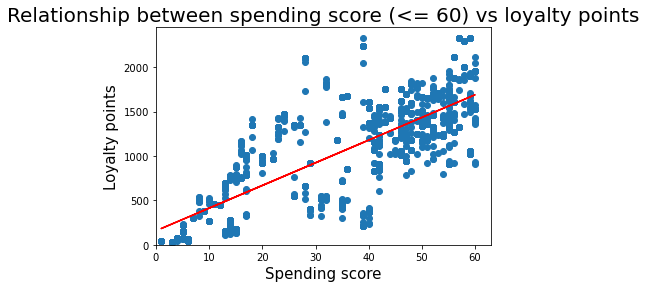

In [29]:
# Plot the graph with a regression line.
plt.scatter(x_sslp_60, y_sslp_60)

plt.plot(x_sslp_60, y_pred_sslp_60, color='red')

plt.xlim(0)
plt.ylim(0)
plt.title('Relationship between spending score (<= 60) vs loyalty points', size=20)
plt.xlabel('Spending score', size=15)
plt.ylabel('Loyalty points', size=15)

# Save plot as JPG image.
plt.savefig('ss_vs_lp.jpg', dpi=144)

# View the plot.
plt.show()

In [30]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_60 = sms.het_breuschpagan(test_sslp_60.resid,
                                    test_sslp_60.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_60 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_60, test_sslp_60)))

# LM Test p-value = 0.3943642106649826 > 0.05 => we fail to reject the H0
# (the residuals are distributed with equal variance), and assume homoscedasticity.

{'LM stat': 0.7254432417142823, 'LM Test p-value': 0.3943642106649826, 'F-stat': 0.7247664973644982, 'F-test p-value': 0.39473417092266727}


**e) split reviews_fnl DataFrame by selecting rows with spending score values > 60 and fit OLS model again:**

In [31]:
# Select rows with spending score values > 60 from reviews_fnl DataFrame.
reviews_fnl_61 = reviews_fnl[reviews_fnl['spending_score'] > 60].reset_index()

# View DataFrame (633 entries included out of 2000 entries in reviews_fnl DataFrame).
reviews_fnl_61.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 633 entries, 0 to 632
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 633 non-null    int64  
 1   gender                633 non-null    object 
 2   age                   633 non-null    int64  
 3   remuneration          633 non-null    float64
 4   spending_score        633 non-null    int64  
 5   loyalty_points        633 non-null    int64  
 6   education             633 non-null    object 
 7   product_code          633 non-null    int64  
 8   review                633 non-null    object 
 9   summary               633 non-null    object 
 10  loyalty_points_log10  633 non-null    float64
dtypes: float64(2), int64(5), object(4)
memory usage: 54.5+ KB


In [32]:
# Independent variable.
x_sslp_61 = reviews_fnl_61['spending_score']

# Dependent variable.
y_sslp_61 = reviews_fnl_61['loyalty_points']

# OLS model and summary.
f_sslp_61 = 'y_sslp_61 ~ x_sslp_61'
test_sslp_61 = ols(f_sslp_61, data=reviews_fnl_61).fit()
test_sslp_61.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              y_sslp_61   R-squared:                       0.085
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     58.35
Date:                Wed, 04 Jan 2023   Prob (F-statistic):           8.15e-14
Time:                        14:53:38   Log-Likelihood:                -5559.3
No. Observations:                 633   AIC:                         1.112e+04
Df Residuals:                     631   BIC:                         1.113e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1171.9856    507.081     -2.311      0.021   -2167.756    -176.215
x_sslp_61     47.6652      6.240      7.639      0.000      35.412      59.918
==============================================================================
Omnibus:                      276.221   Durbin-Watson:                   0.384
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.605
Skew:                           0.073   Prob(JB):                     3.06e-08
Kurtosis:                       1.864   Cond. No.                         656.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [33]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_61 = sms.het_breuschpagan(test_sslp_61.resid,
                                    test_sslp_61.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_61 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_61, test_sslp_61)))

# LM Test p-value = 7.250135584741414e-11 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 42.450298264357265, 'LM Test p-value': 7.250135584741414e-11, 'F-stat': 45.35797431796883, 'F-test p-value': 3.6981508740877824e-11}


In [34]:
# Use a log10 transformation of the dependent variable (loyalty_points) for reducing
# heteroscedasticity.

# Independent variable.
x_sslp_61 = reviews_fnl_61['spending_score']

# Dependent variable.
y_sslp_log10_61 = reviews_fnl_61['loyalty_points_log10']

# OLS model and summary.
f_sslp_log10_61 = 'y_sslp_log10_61 ~ x_sslp_61'
test_sslp_log10_61 = ols(f_sslp_log10_61, data=reviews_fnl_61).fit()
test_sslp_log10_61.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        y_sslp_log10_61   R-squared:                       0.068
Model:                            OLS   Adj. R-squared:                  0.067
Method:                 Least Squares   F-statistic:                     46.29
Date:                Wed, 04 Jan 2023   Prob (F-statistic):           2.37e-11
Time:                        14:53:38   Log-Likelihood:                -169.69
No. Observations:                 633   AIC:                             343.4
Df Residuals:                     631   BIC:                             352.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.6325      0.102     25.885      0.000       2.433       2.832
x_sslp_61      0.0085      0.001      6.804      0.000       0.006       0.011
==============================================================================
Omnibus:                     2258.463   Durbin-Watson:                   0.294
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               62.625
Skew:                          -0.379   Prob(JB):                     2.52e-14
Kurtosis:                       1.658   Cond. No.                         656.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [35]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_sslp_log10_61 = 0.0085
const_sslp_log10_61 = 2.6325
y_pred_sslp_log10_61 = const_sslp_log10_61 + x_coef_sslp_log10_61 * x_sslp_61

# View the output.
y_pred_sslp_log10_61

0      3.3210
1      3.2870
2      3.2785
3      3.4315
4      3.2445
        ...  
628    3.4060
629    3.2870
630    3.3550
631    3.2190
632    3.4060
Name: spending_score, Length: 633, dtype: float64

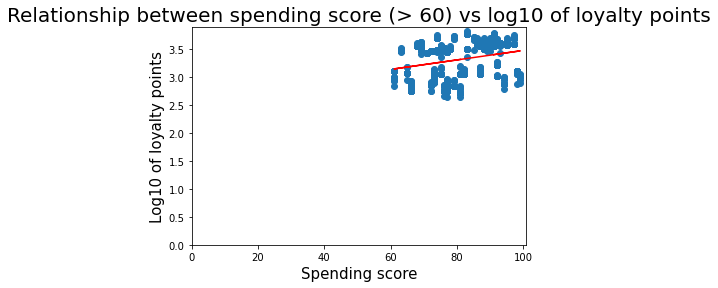

In [36]:
# Plot the graph with a regression line.
plt.scatter(x_sslp_61, y_sslp_log10_61)

plt.plot(x_sslp_61, y_pred_sslp_log10_61, color='red')

plt.xlim(0)
plt.ylim(0)
plt.title('Relationship between spending score (> 60) vs log10 of loyalty points', size=20)
plt.xlabel('Spending score', size=15)
plt.ylabel('Log10 of loyalty points', size=15)

# Save plot as JPG image.
plt.savefig('ss_vs_log_lp.jpg', dpi=144)

# View the plot.
plt.show()

In [37]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_sslp_log10_61 = sms.het_breuschpagan(test_sslp_log10_61.resid,
                                          test_sslp_log10_61.model.exog)

# Print the results of the Breusch-Pagan test.
terms_sslp_log10_61 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_sslp_log10_61, test_sslp_log10_61)))

# LM Test p-value = 0.23234078380154152 > 0.05 => we fail to reject the H0
# (the residuals are distributed with equal variance), and assume homoscedasticity.

{'LM stat': 1.4264737726632337, 'LM Test p-value': 0.23234078380154152, 'F-stat': 1.4251784046858507, 'F-test p-value': 0.2330015513333428}


### 5b) remuneration vs loyalty points

In [38]:
# Independent variable.
x_ailp = reviews_fnl['remuneration']

# Dependent variable.
y_ailp = reviews_fnl['loyalty_points']

# OLS model and summary.
f_ailp = 'y_ailp ~ x_ailp'
test_ailp = ols(f_ailp, data=reviews_fnl).fit()
test_ailp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 y_ailp   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):          2.43e-209
Time:                        14:53:38   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -65.6865     52.171     -1.259      0.208    -168.001      36.628
x_ailp        34.1878      0.978     34.960      0.000      32.270      36.106
==============================================================================
Omnibus:                       21.285   Durbin-Watson:                   3.622
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               31.715
Skew:                           0.089   Prob(JB):                     1.30e-07
Kurtosis:                       3.590   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [39]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_ailp.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_ailp.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_ailp.predict())

Estimated parameters:
 Intercept   -65.686513
x_ailp       34.187825
dtype: float64

Standard errors:
 Intercept    52.170717
x_ailp        0.977925
dtype: float64

Predicted values:
 [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


In [40]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_ailp = 34.187825
const_ailp = (-65.686513)
y_pred_ailp = const_ailp + x_coef_ailp * x_ailp

# View the output.
y_pred_ailp

0        354.823735
1        354.823735
2        382.857751
3        382.857751
4        410.891767
           ...     
1995    2821.817186
1996    3102.157351
1997    3102.157351
1998    3298.395467
1999    3102.157351
Name: remuneration, Length: 2000, dtype: float64

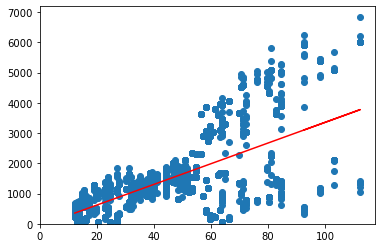

In [41]:
# Plot the graph with a regression line.
plt.scatter(x_ailp, y_ailp)

plt.plot(x_ailp, y_pred_ailp, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [42]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_ailp = sms.het_breuschpagan(test_ailp.resid, test_ailp.model.exog)

# Print the results of the Breusch-Pagan test.
terms_ailp = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_ailp, test_ailp)))

# LM Test p-value = 7.153051772822205e-228 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 1038.6445487288283, 'LM Test p-value': 7.153051772822205e-228, 'F-stat': 2158.6311344219334, 'F-test p-value': 3.68e-320}


In [43]:
# Use a log10 transformation of the dependent variable (loyalty_points) for reducing
# heteroscedasticity.

# Independent variable.
x_ailp1 = reviews_fnl['remuneration']

# Dependent variable.
y_ailp1 = reviews_fnl['loyalty_points_log10']

# OLS model and summary.
f_ailp1 = 'y_ailp1 ~ x_ailp1'
test_ailp1 = ols(f_ailp1, data=reviews_fnl).fit()
test_ailp1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                y_ailp1   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     794.3
Date:                Wed, 04 Jan 2023   Prob (F-statistic):          1.98e-147
Time:                        14:53:39   Log-Likelihood:                -875.08
No. Observations:                2000   AIC:                             1754.
Df Residuals:                    1998   BIC:                             1765.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5408      0.019    131.318      0.000       2.503       2.579
x_ailp1        0.0102      0.000     28.184      0.000       0.010       0.011
==============================================================================
Omnibus:                      610.463   Durbin-Watson:                   2.844
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1512.287
Skew:                          -1.669   Prob(JB):                         0.00
Kurtosis:                       5.647   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [44]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_ailp1.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_ailp1.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_ailp1.predict())

Estimated parameters:
 Intercept    2.540847
x_ailp1      0.010222
dtype: float64

Standard errors:
 Intercept    0.019349
x_ailp1      0.000363
dtype: float64

Predicted values:
 [2.66657752 2.66657752 2.67495956 ... 3.48801698 3.54669122 3.48801698]


In [45]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_ailp1 = 0.010222
const_ailp1 = 2.540847
y_pred_ailp1 = const_ailp1 + x_coef_ailp1 * x_ailp1

# View the output.
y_pred_ailp

0        354.823735
1        354.823735
2        382.857751
3        382.857751
4        410.891767
           ...     
1995    2821.817186
1996    3102.157351
1997    3102.157351
1998    3298.395467
1999    3102.157351
Name: remuneration, Length: 2000, dtype: float64

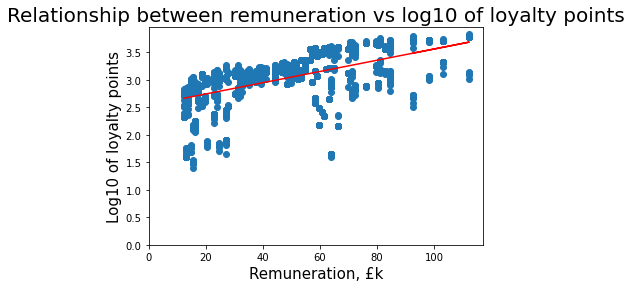

In [46]:
# Plot the graph with a regression line.
plt.scatter(x_ailp1, y_ailp1)

plt.plot(x_ailp1, y_pred_ailp1, color='red')

plt.xlim(0)
plt.ylim(0)
plt.title('Relationship between remuneration vs log10 of loyalty points', size=20)
plt.xlabel('Remuneration, £k', size=15)
plt.ylabel('Log10 of loyalty points', size=15)

# Save plot as JPG image.
plt.savefig('ai_vs_log_lp.jpg', dpi=144)

# View the plot.
plt.show()

In [47]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_ailp1 = sms.het_breuschpagan(test_ailp1.resid, test_ailp1.model.exog)

# Print the results of the Breusch-Pagan test.
terms_ailp1 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_ailp1, test_ailp1)))

# LM Test p-value = 0.8272107748026084 > 0.05 => we fail to reject the H0
# (the residuals are distributed with equal variance), and assume homoscedasticity.

{'LM stat': 0.04764626018283202, 'LM Test p-value': 0.8272107748026084, 'F-stat': 0.04759974789772982, 'F-test p-value': 0.8273160836318402}


### 5c) age vs loyalty points

In [48]:
# Independent variable.
x_alp = reviews_fnl['age']

# Dependent variable.
y_alp = reviews_fnl['loyalty_points']

# OLS model and summary.
f_alp = 'y_alp ~ x_alp'
test_alp = ols(f_alp, data=reviews_fnl).fit()
test_alp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  y_alp   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Wed, 04 Jan 2023   Prob (F-statistic):             0.0577
Time:                        14:53:39   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
x_alp         -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [49]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_alp.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_alp.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_alp.predict())

Estimated parameters:
 Intercept    1736.517739
x_alp          -4.012805
dtype: float64

Standard errors:
 Intercept    88.248731
x_alp         2.113177
dtype: float64

Predicted values:
 [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [50]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_alp = (-4.012805)
const_alp = 1736.517739
y_pred_alp = const_alp + x_coef_alp * x_alp

# View the output.
y_pred_alp

0       1664.287249
1       1644.223224
2       1648.236029
3       1636.197614
4       1604.095174
           ...     
1995    1588.043954
1996    1563.967124
1997    1600.082369
1998    1600.082369
1999    1608.107979
Name: age, Length: 2000, dtype: float64

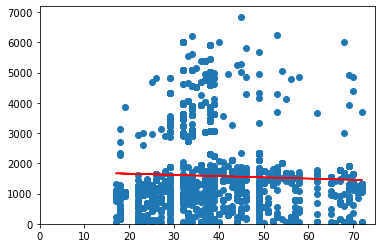

In [51]:
# Plot the graph with a regression line.
plt.scatter(x_alp, y_alp)

plt.plot(x_alp, y_pred_alp, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [52]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_alp = sms.het_breuschpagan(test_alp.resid, test_alp.model.exog)

# Print the results of the Breusch-Pagan test.
terms_alp = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_alp, test_alp)))

# LM Test p-value = 0.00030407066519251314 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 13.045150861307642, 'LM Test p-value': 0.00030407066519251314, 'F-stat': 13.11766668084642, 'F-test p-value': 0.0002998192355800465}


In [53]:
# Use a log10 transformation of the dependent variable (loyalty_points) for reducing
# heteroscedasticity.

# Independent variable.
x_alp1 = reviews_fnl['age']

# Dependent variable.
y_alp1 = reviews_fnl['loyalty_points_log10']

# OLS model and summary.
f_alp1 = 'y_alp1 ~ x_alp1'
test_alp1 = ols(f_alp1, data=reviews_fnl).fit()
test_alp1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 y_alp1   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.393
Date:                Wed, 04 Jan 2023   Prob (F-statistic):              0.122
Time:                        14:53:39   Log-Likelihood:                -1208.6
No. Observations:                2000   AIC:                             2421.
Df Residuals:                    1998   BIC:                             2432.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.0769      0.030    100.926      0.000       3.017       3.137
x_alp1        -0.0011      0.001     -1.547      0.122      -0.003       0.000
==============================================================================
Omnibus:                      392.087   Durbin-Watson:                   2.036
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              748.718
Skew:                          -1.180   Prob(JB):                    2.62e-163
Kurtosis:                       4.847   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [54]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_alp1.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_alp1.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_alp1.predict())

Estimated parameters:
 Intercept    3.076916
x_alp1      -0.001129
dtype: float64

Standard errors:
 Intercept    0.030487
x_alp1       0.000730
dtype: float64

Predicted values:
 [3.05658701 3.05094008 3.05206946 ... 3.03851684 3.03851684 3.04077561]


In [55]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_alp1 = (-0.001129)
const_alp1 = 3.076916
y_pred_alp1 = const_alp1 + x_coef_alp1 * x_alp1

# View the output.
y_pred_alp1

0       3.056594
1       3.050949
2       3.052078
3       3.048691
4       3.039659
          ...   
1995    3.035143
1996    3.028369
1997    3.038530
1998    3.038530
1999    3.040788
Name: age, Length: 2000, dtype: float64

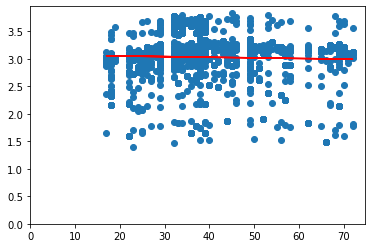

In [56]:
# Plot the graph with a regression line.
plt.scatter(x_alp1, y_alp1)

plt.plot(x_alp1, y_pred_alp1, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [57]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_alp1 = sms.het_breuschpagan(test_alp1.resid, test_alp1.model.exog)

# Print the results of the Breusch-Pagan test.
terms_alp1 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_alp1, test_alp1)))

# LM Test p-value = 0.16765562765447406 > 0.05 => we fail to reject the H0
# (the residuals are distributed with equal variance), and assume homoscedasticity.

{'LM stat': 1.9037817803251311, 'LM Test p-value': 0.16765562765447406, 'F-stat': 1.9036901038123868, 'F-test p-value': 0.16782024254716696}


### Additional question: a) remuneration vs spending score

In [58]:
# Independent variable.
x_aiss = reviews_fnl['remuneration']

# Dependent variable.
y_aiss = reviews_fnl['spending_score']

# OLS model and summary.
f_aiss = 'y_aiss ~ x_aiss'
test_aiss = ols(f_aiss, data=reviews_fnl).fit()
test_aiss.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 y_aiss   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                   0.06294
Date:                Wed, 04 Jan 2023   Prob (F-statistic):              0.802
Time:                        14:53:40   Log-Likelihood:                -9360.8
No. Observations:                2000   AIC:                         1.873e+04
Df Residuals:                    1998   BIC:                         1.874e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     49.6955      1.347     36.899      0.000      47.054      52.337
x_aiss         0.0063      0.025      0.251      0.802      -0.043       0.056
==============================================================================
Omnibus:                      256.861   Durbin-Watson:                   3.699
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               66.806
Skew:                          -0.044   Prob(JB):                     3.11e-15
Kurtosis:                       2.109   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [59]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_aiss.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_aiss.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_aiss.predict())

Estimated parameters:
 Intercept    49.695490
x_aiss        0.006334
dtype: float64

Standard errors:
 Intercept    1.346809
x_aiss       0.025246
dtype: float64

Predicted values:
 [49.77339247 49.77339247 49.77858596 ... 50.28235444 50.31870887
 50.28235444]


In [60]:
# Set the X coefficient and the constant to generate the regression table.
x_coef_aiss = 0.006334
const_aiss = 49.695490
y_pred_aiss = const_aiss + x_coef_aiss * x_aiss

# View the output.
y_pred_aiss

0       49.773398
1       49.773398
2       49.778592
3       49.778592
4       49.783786
          ...    
1995    50.230460
1996    50.282398
1997    50.282398
1998    50.318756
1999    50.282398
Name: remuneration, Length: 2000, dtype: float64

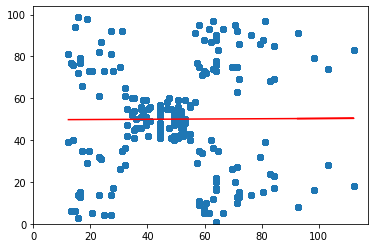

In [61]:
# Plot the graph with a regression line.
plt.scatter(x_aiss, y_aiss)

plt.plot(x_aiss, y_pred_aiss, color='red')

plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

### Additional question: b) spending score and remuneration vs loyalty points

In [62]:
# Define the independent variable.
X_salp = reviews_fnl[['spending_score', 'remuneration']]

# Define the dependent variable.
y_salp = reviews_fnl['loyalty_points']

# OLS model and summary.
f_salp = 'y_salp ~ X_salp'
test_salp = ols(f_salp, data=reviews_fnl).fit()
test_salp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 y_salp   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     4770.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:40   Log-Likelihood:                -15398.
No. Observations:                2000   AIC:                         3.080e+04
Df Residuals:                    1997   BIC:                         3.082e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1700.3051     35.740    -47.575      0.000   -1770.396   -1630.214
X_salp[0]     32.8927      0.458     71.845      0.000      31.995      33.791
X_salp[1]     33.9795      0.517     65.769      0.000      32.966      34.993
==============================================================================
Omnibus:                        4.723   Durbin-Watson:                   3.477
Prob(Omnibus):                  0.094   Jarque-Bera (JB):                4.650
Skew:                           0.103   Prob(JB):                       0.0978
Kurtosis:                       3.115   Cond. No.                         220.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [63]:
# Extract the estimated parameters.
print('Estimated parameters:\n', test_salp.params)

# Extract the standard errors.
print('\nStandard errors:\n', test_salp.bse)

# Extract the predicted values.
print('\nPredicted values:\n', test_salp.predict())

Estimated parameters:
 Intercept   -1700.305097
X_salp[0]      32.892695
X_salp[1]      33.979499
dtype: float64

Standard errors:
 Intercept    35.739558
X_salp[0]     0.457831
X_salp[1]     0.516648
dtype: float64

Predicted values:
 [ 4.57831319e-01  1.38195101e+03 -1.05713790e+03 ...  4.44147048e+03
  2.16956070e+03  1.71137682e+03]


In [64]:
# Check for multicollinearity:
# Add a constant.
x_temp = sm.add_constant(X_salp)

# Create an empty DataFrame.
vif = pd.DataFrame()

# Calculate the 'vif' for each value.
vif['VIF Factor'] = [
    variance_inflation_factor(x_temp.values, i)
    for i in range(x_temp.values.shape[1])
]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to two decimal points.
print(vif.round(2))

# VIF Factors for spending score and remuneration = 1 => no correlation between independent
# variables.

   VIF Factor        features
0        8.95           const
1        1.00  spending_score
2        1.00    remuneration


In [65]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_salp = sms.het_breuschpagan(test_salp.resid, test_salp.model.exog)

# Print the results of the Breusch-Pagan test.
terms_salp = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_salp, test_salp)))

# LM Test p-value = 2.154885846504576e-12 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 53.726566730470935, 'LM Test p-value': 2.154885846504576e-12, 'F-stat': 27.56343274452234, 'F-test p-value': 1.5545263629723393e-12}


In [66]:
# Use a log10 transformation of the dependent variable (loyalty_points) for reducing
# heteroscedasticity.

# Define the independent variable.
X_salp1 = reviews_fnl[['spending_score', 'remuneration']]

# Define the dependent variable.
y_salp1 = reviews_fnl['loyalty_points_log10']

# OLS model and summary.
f_salp1 = 'y_salp1 ~ X_salp1'
test_salp1 = ols(f_salp1, data=reviews_fnl).fit()
test_salp1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                y_salp1   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     3965.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:40   Log-Likelihood:                 393.90
No. Observations:                2000   AIC:                            -781.8
Df Residuals:                    1997   BIC:                            -765.0
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.9355      0.013    145.462      0.000       1.909       1.962
X_salp1[0]     0.0122      0.000     71.461      0.000       0.012       0.013
X_salp1[1]     0.0101      0.000     52.741      0.000       0.010       0.011
==============================================================================
Omnibus:                      577.517   Durbin-Watson:                   1.183
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1749.729
Skew:                          -1.465   Prob(JB):                         0.00
Kurtosis:                       6.524   Cond. No.                         220.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [67]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_salp1 = sms.het_breuschpagan(test_salp1.resid, test_salp1.model.exog)

# Print the results of the Breusch-Pagan test.
terms_salp1 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_salp1, test_salp1)))

# LM Test p-value = 3.677722072049437e-35 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 158.57636939286434, 'LM Test p-value': 3.677722072049437e-35, 'F-stat': 85.98700603541694, 'F-test p-value': 1.5049803293123268e-36}


In [68]:
# Apply model on observations with spending score values <= 60.
# Define the independent variable.
X_salp_60 = reviews_fnl_60[['spending_score', 'remuneration']]

# Define the dependent variable.
y_salp_60 = reviews_fnl_60['loyalty_points']

# OLS model and summary.
f_salp_60 = 'y_salp_60 ~ X_salp_60'
test_salp_60 = ols(f_salp_60, data=reviews_fnl_60).fit()
test_salp_60.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              y_salp_60   R-squared:                       0.839
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     3564.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:40   Log-Likelihood:                -9393.2
No. Observations:                1367   AIC:                         1.879e+04
Df Residuals:                    1364   BIC:                         1.881e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     -600.9112     22.086    -27.208      0.000    -644.237    -557.585
X_salp_60[0]    28.0027      0.361     77.468      0.000      27.294      28.712
X_salp_60[1]    14.2248      0.316     45.005      0.000      13.605      14.845
==============================================================================
Omnibus:                        6.844   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.033   Jarque-Bera (JB):                6.861
Skew:                          -0.158   Prob(JB):                       0.0324
Kurtosis:                       2.855   Cond. No.                         216.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [69]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_salp_60 = sms.het_breuschpagan(test_salp_60.resid, test_salp_60.model.exog)

# Print the results of the Breusch-Pagan test.
terms_salp_60 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_salp_60, test_salp_60)))

# LM Test p-value = 2.884258563280549e-11 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 48.538336306267304, 'LM Test p-value': 2.884258563280549e-11, 'F-stat': 25.10740074772766, 'F-test p-value': 1.9584501384266513e-11}


### Additional question: c) spending score, remuneration and age vs loyalty points

In [70]:
# Define the independent variable.
X_saalp = reviews_fnl[['spending_score', 'remuneration', 'age']]

# Define the dependent variable.
y_saalp = reviews_fnl['loyalty_points']

# OLS model and summary.
f_saalp = 'y_saalp ~ X_saalp'
test_saalp = ols(f_saalp, data=reviews_fnl).fit()
test_saalp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                y_saalp   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     3491.
Date:                Wed, 04 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:53:40   Log-Likelihood:                -15320.
No. Observations:                2000   AIC:                         3.065e+04
Df Residuals:                    1996   BIC:                         3.067e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2203.0598     52.361    -42.075      0.000   -2305.747   -2100.372
X_saalp[0]    34.1832      0.452     75.638      0.000      33.297      35.070
X_saalp[1]    34.0084      0.497     68.427      0.000      33.034      34.983
X_saalp[2]    11.0607      0.869     12.730      0.000       9.357      12.765
==============================================================================
Omnibus:                       22.644   Durbin-Watson:                   3.453
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               24.110
Skew:                           0.227   Prob(JB):                     5.82e-06
Kurtosis:                       3.290   Cond. No.                         377.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [71]:
# Check for multicollinearity:
# Add a constant.
x_temp = sm.add_constant(X_saalp)

# Create an empty DataFrame.
vif = pd.DataFrame()

# Calculate the 'vif' for each value.
vif['VIF Factor'] = [
    variance_inflation_factor(x_temp.values, i)
    for i in range(x_temp.values.shape[1])
]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to two decimal points.
print(vif.round(2))

# VIF Factors for spending score, remuneration and age = 1 => no correlation between independent
# variables.

   VIF Factor        features
0       20.77           const
1        1.05  spending_score
2        1.00    remuneration
3        1.05             age


In [72]:
# Check for heteroscedasticity:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_saalp = sms.het_breuschpagan(test_saalp.resid, test_saalp.model.exog)

# Print the results of the Breusch-Pagan test.
terms_saalp = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_saalp, test_saalp)))

# LM Test p-value = 2.1023793543808707e-09 < 0.05 => we fail to accept the H0
# (the residuals are distributed with equal variance), and assume that heteroscedasticity
# is present.

{'LM stat': 43.322137374722125, 'LM Test p-value': 2.1023793543808707e-09, 'F-stat': 14.730918470133673, 'F-test p-value': 1.7293587945211297e-09}


## 6. Observations and insights

**Spending score vs loyalty points:**

Despite the overall positive relationship between spending score and loyalty points variables, the high level of heteroskedasticity in the residuals made the regression model estimators inefficient. The decision was made to split the data set into two groups: spending score <= 60 and spending score > 60:

**a) spending score (when it's <= 60) vs loyalty points:**

t-value tests (P>|t|) for x coefficient = 0 => it is < 0.05, thus the spending score (x) is significant in predicting loyalty points (y);

R-squared = 0.601 => 60.1% of the total variability of y (loyalty points), is explained by the variability of x (spending score);

Coefficient of x = 25.5150 => if the spending score (x) will increase by 1 unit, the number of loyalty points (y) will increase by 25.52 units;

[0.025	0.975] describe the 95% confidence interval of the true x coefficient, i.e. the true slope. For instance, if we take a different sample, the estimated slope will be slightly different. If we take 100 random samples each of 500 observations of x and y, then 95 out of the 100 samples will derive a slope that is within the interval (24.411, 26.619).

**b) spending score (when it's > 60) vs log10 of loyalty points:**

High level of heteroskedasticity in the residuals was detected when a relationship between spending score and loyalty points variables was investigated. It was fixed by using a log transformation on the dependent variable (loyalty points).

t-value tests (P>|t|) = 0 => it is < 0.05, thus the spending score (x) is significant in predicting loyalty points (y);

R-squared = 0.068 => 6.8% of the total variability of y (loyalty points), is explained by the variability of x (spending score);

Coefficient of x = 0.0085 => if the spending score (x) will increase by 1 unit, the log10 of loyalty points (log10 of y) will increase by 0.0085 unit, therefore number of loyalty points (y) will increase by 1.020 units (=1.02);

[0.025	0.975] describe the 95% confidence interval of the true x coefficient, i.e. the true slope. For instance, if we take a different sample, the estimated slope will be slightly different. If we take 100 random samples each of 500 observations of x and y, then 95 out of the 100 samples will derive a slope that is within the interval (0.006, 0.011).

**Remuneration vs log10 of loyalty points:**

High level of heteroskedasticity in the residuals was detected when a relationship between remuneration and loyalty points variables was investigated. It was fixed by using a log transformation on the dependent variable (loyalty points).

t-value tests (P>|t|) = 0 => it is < 0.05, thus the remuneration (x) is significant in predicting loyalty points (y);

R-squared = 0.284 => 28.4% of the total variability of y (loyalty points), is explained by the variability of x (remuneration);

Coefficient of x = 0.0102 => if the remuneration (x) will increase by 1 unit (= £1,000), the log10 of loyalty points (y) will increase by 0.0102 units, therefore number of loyalty points (y) will increase by 1.024 units (=1.02);

[0.025	0.975] describe the 95% confidence interval of the true x coefficient, i.e. the true slope. For instance, if we take a different sample, the estimated slope will be slightly different. If we take 100 random samples each of 500 observations of x and y, then 95 out of the 100 samples will derive a slope that is within the interval (0.010, 0.011).

**Age vs log10 of loyalty points:**

High level of heteroskedasticity in the residuals was detected when a relationship between age and loyalty points variables was investigated. It was fixed by using a log transformation on the dependent variable (loyalty points).

t-value tests (P>|t|) = 0.122 => it is > 0.05, thus the age (x) is insignificant in predicting loyalty points (y).

# 

# Week 2 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

## Instructions
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df2`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Load and explore the data

In [73]:
# Import necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

import warnings

warnings.filterwarnings('ignore')

In [74]:
# Load the CSV file(s) as df2.
df2 = pd.read_csv('reviews_final.csv', index_col=0)

# View DataFrame.
df2.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [75]:
# Drop unnecessary columns.
df2.drop(columns=['gender', 'age', 'loyalty_points', 'education', 'product_code', 'review', 'summary'],
         axis=1,
         inplace=True)

# View DataFrame.
df2

,remuneration,spending_score
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40
...,...,...
1995,84.46,69
1996,92.66,8
1997,92.66,91
1998,98.40,16


In [76]:
# Explore the data.
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   remuneration    2000 non-null   float64
 1   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 46.9 KB


In [77]:
# Descriptive statistics.
df2.describe()

,remuneration,spending_score
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## 2. Plot

In [78]:
# Standardize the data to have a mean of zero and a standard deviation of one
df2.iloc[:,:2] = StandardScaler().fit_transform(df2.iloc[:,:2])

# View DataFrame.
df2

,remuneration,spending_score
0,-1.547658,-0.421647
1,-1.547658,1.188278
2,-1.512188,-1.686588
3,-1.512188,1.034952
4,-1.476718,-0.383315
...,...,...
1995,1.573692,0.728299
1996,1.928391,-1.609925
1997,1.928391,1.571593
1998,2.176680,-1.303272


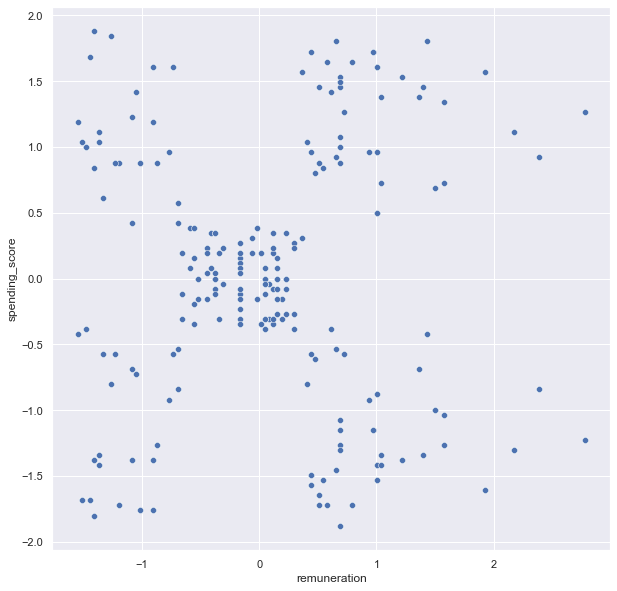

In [79]:
# Set figure size.
sns.set(rc={'figure.figsize': (10, 10)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a scatterplot with Seaborn.
sns.scatterplot(x='remuneration', y='spending_score', data=df2)

# View the plot.
plt.show()

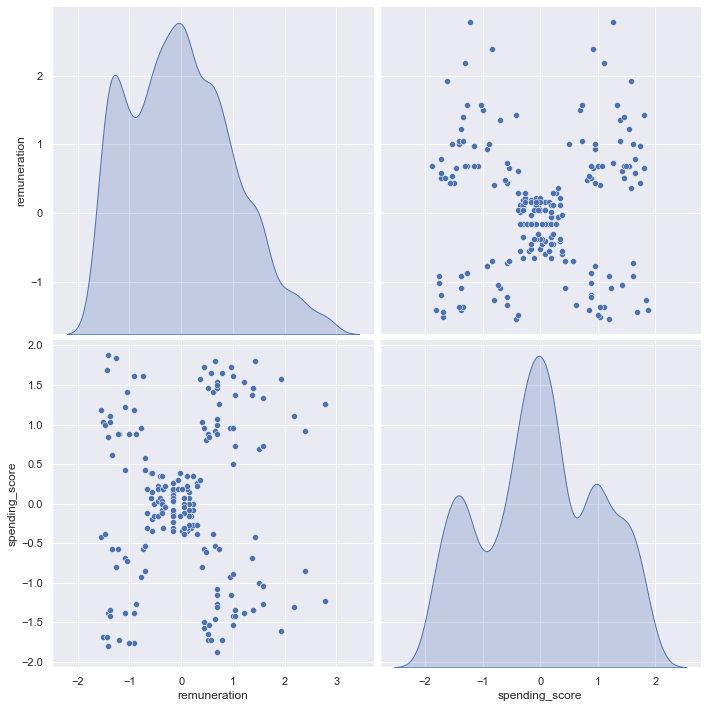

In [80]:
# Create a pairplot with Seaborn.
x = df2[['remuneration', 'spending_score']]

sns.pairplot(df2, vars=x, diag_kind='kde', height=5)

## 3. Elbow and silhouette methods

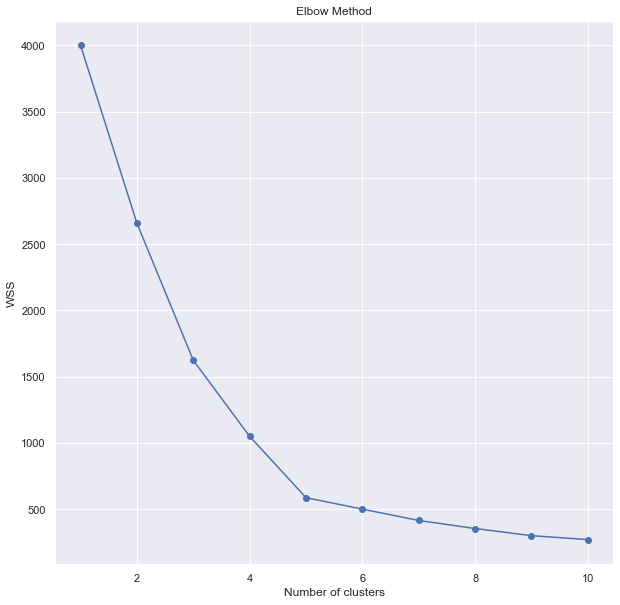

In [81]:
# Determine the number of clusters: Elbow method.
ss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=500,
                    n_init=10,
                    random_state=42)
    kmeans.fit(x)
    ss.append(kmeans.inertia_)

plt.plot(range(1, 11), ss, marker='o')

plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WSS')

# Save plot as JPG image.
plt.savefig('elbow.jpg', dpi=144)

plt.show()

The line representing within-cluster sum of squares (WSS) per number of clusters (*k*) becomes more linear between *k*=4 and 6, indicating that *k*=5 might be an optimal number of clusters for the data set.

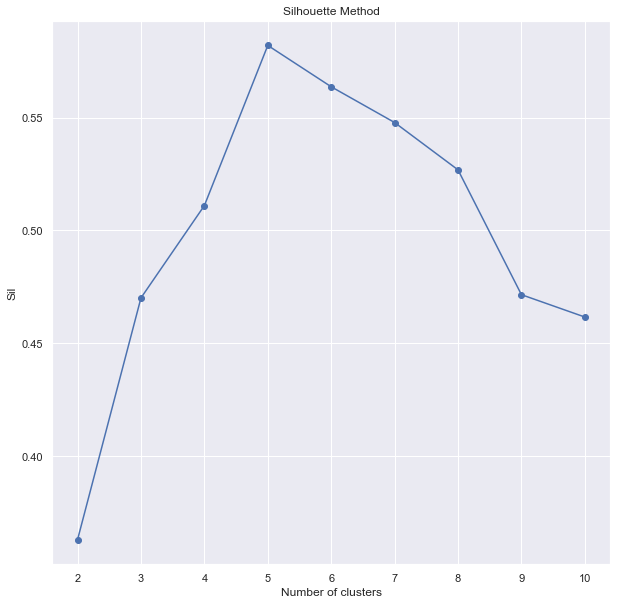

In [82]:
# Determine the number of clusters: Silhouette method.
sil = []
kmax = 10

for k in range(2, kmax + 1):
    kmeans_s = KMeans(n_clusters=k).fit(x)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(x, labels, metric='euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax + 1), sil, marker='o')

plt.title('Silhouette Method')
plt.xlabel('Number of clusters')
plt.ylabel('Sil')

# Save plot as JPG image.
plt.savefig('silhouette.jpg', dpi=144)

plt.show()

The peak of the line representing the average silhouette of observations (Sil) for different number of clusters (*k*) is between *k*=4 and 6, indicating that *k*=5 might be an optimal number of clusters for the data set. 

Sil for *k*=7 is larger than Sil for *k*=4, therefore it might be good to evaluate k-means model with *k*=7.

## 4. Evaluate k-means model at different values of *k*

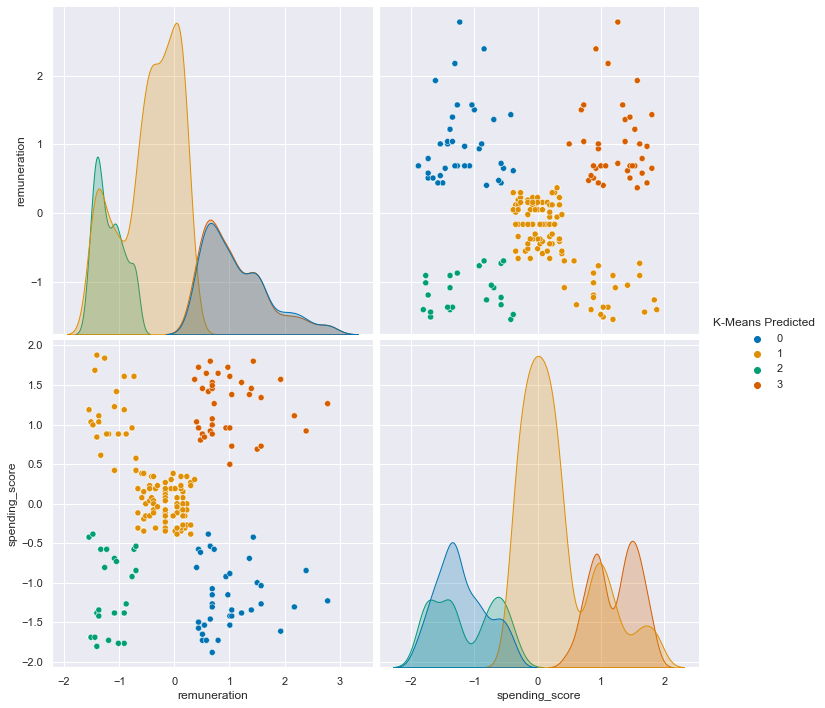

In [83]:
# Use 4 clusters:
kmeans_4 = KMeans(n_clusters=4,
                max_iter=15000,
                init='k-means++',
                random_state=42).fit(x)

clusters_4 = kmeans_4.labels_
x['K-Means Predicted'] = clusters_4

# Plot the predicted.
km4 = sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind='kde',
             palette='colorblind',
             height=5)

# View pairplot.
plt.show()

A lot of overlapping between identified clusters within both, spending score and annual income, histograms. Clusters 0 and 3 look almost identical on annual income histogram. 

Cluster 1 might contains two groups of data points: 
1) data points in the centre of the scatterplot which are closely positioned to each other;

2) data points in the top left corner (bottom left scatterplot) which have larger distances between data points. 

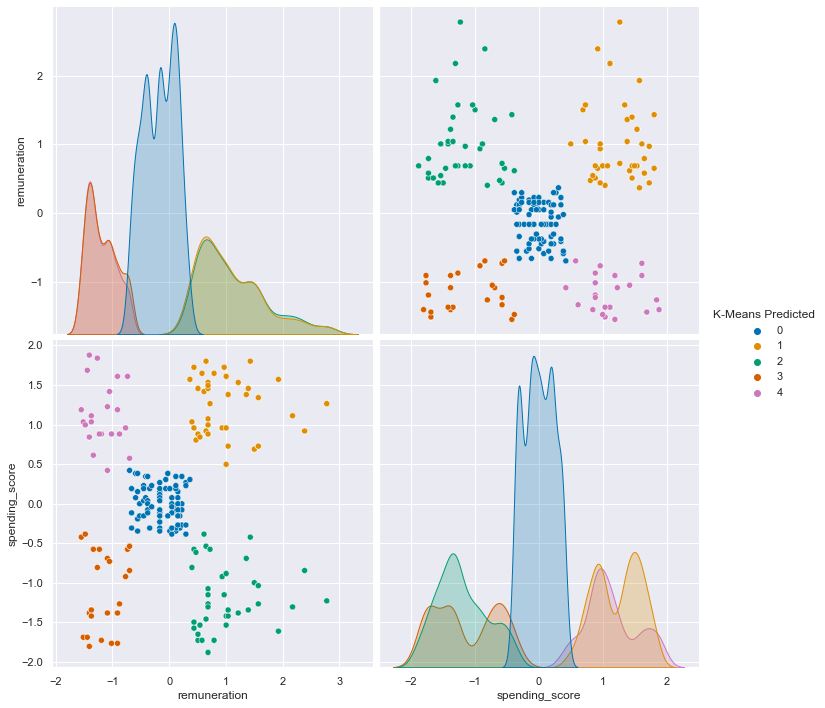

In [84]:
# Use 5 clusters:
kmeans_5 = KMeans(n_clusters=5,
                max_iter=15000,
                init='k-means++',
                random_state=42).fit(x)

clusters_5 = kmeans_5.labels_
x['K-Means Predicted'] = clusters_5

# Plot the predicted.
km5 = sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind='kde',
             palette='colorblind',
             height=5)

# Save plot as JPG image.
plt.savefig('k5.jpg', dpi=144)

# View pairplot.
plt.show()

Still a lot of overlapping between identified clusters within both, spending score and annual income, histograms. On the annual income histogram clusters 1 and 2 (0 and 3 on the previous model) are still almost identical as well as clusters 3 and 4. 

Scatterplots look good with five clear clusters.

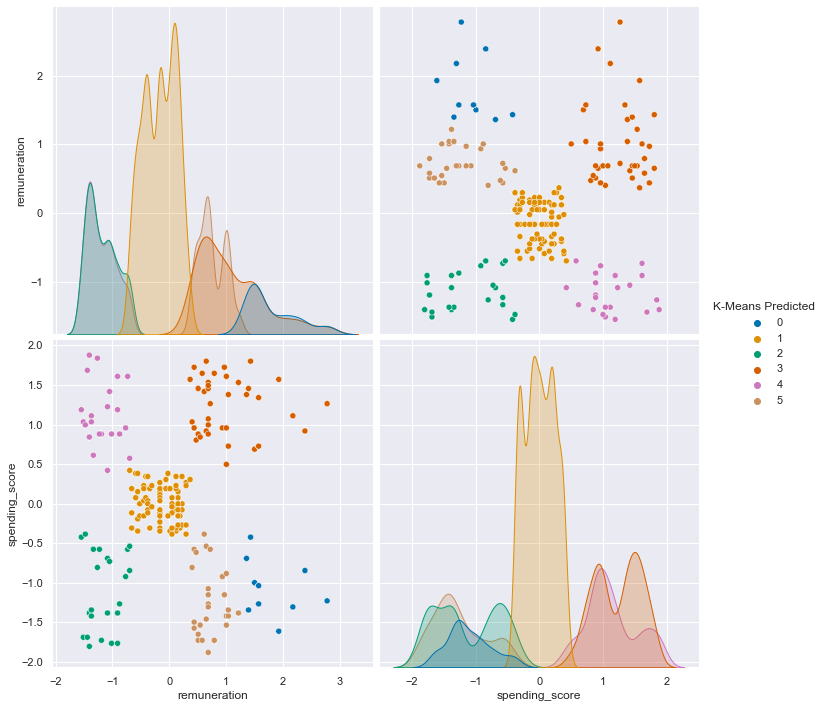

In [85]:
# Use 6 clusters:
kmeans_6 = KMeans(n_clusters=6,
                max_iter=15000,
                init='k-means++',
                random_state=42).fit(x)

clusters_6 = kmeans_6.labels_
x['K-Means Predicted'] = clusters_6

# Plot the predicted.
km6 = sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind='kde',
             palette='colorblind',
             height=5)

# View pairplot.
plt.show()

No significant improvement with histograms.

Clusters 0 and 5 are very close on the scatterplots; I do not think this model would add value comparing to the previous one.

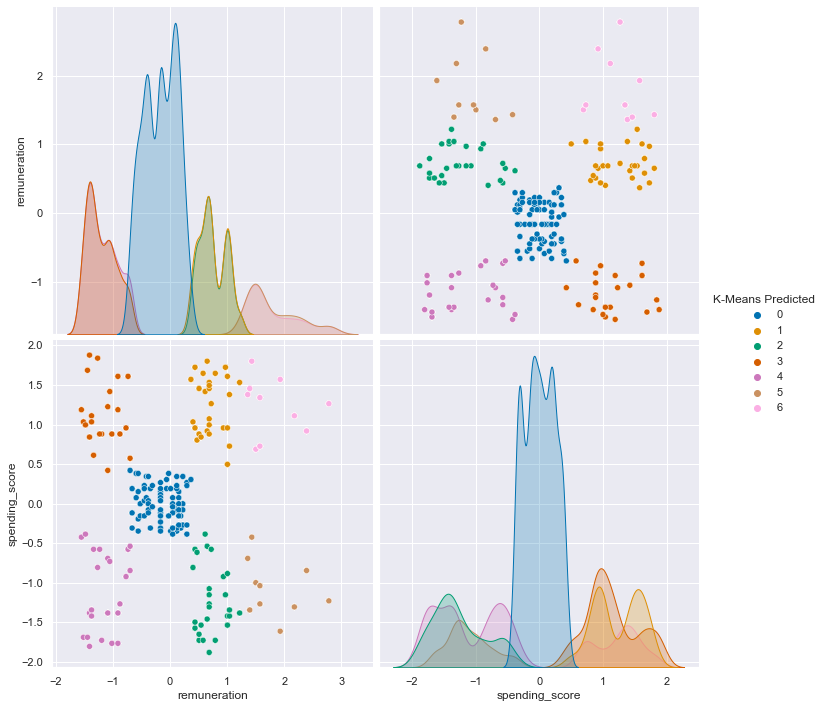

In [86]:
# Use 7 clusters:
kmeans_7 = KMeans(n_clusters=7,
                max_iter=15000,
                init='k-means++',
                random_state=42).fit(x)

clusters_7 = kmeans_7.labels_
x['K-Means Predicted'] = clusters_7

# Plot the predicted.
km7 = sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind='kde',
             palette='colorblind',
             height=5)

# View pairplot.
plt.show()

Histograms became even busier.

- Clusters 2 and 5 are still very close to each other (clusters 0 and 5 on the previous model); 
- Clusters 1 and 6 are also very close to each other.

## 5. Fit final model and justify your choice

Based on the Elbow and Silhouette methods and visual data distribution it seems like the optimal number of clusters is five.

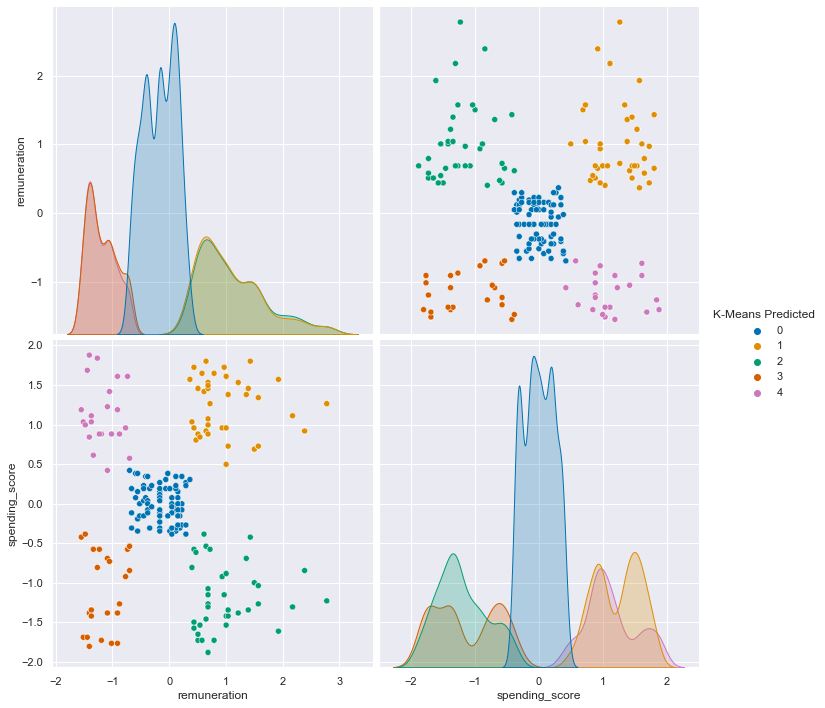

In [87]:
# Use 5 clusters:
# kmeans_5 = KMeans(n_clusters=5,
#                 max_iter=15000,
#                 init='k-means++',
#                 random_state=42).fit(x)
# 
# clusters_5 = kmeans_5.labels_
# x['K-Means Predicted'] = clusters_5

# Plot the predicted.
# km5 = sns.pairplot(x,
#              hue='K-Means Predicted',
#              diag_kind='kde',
#              palette='colorblind',
#              height=5)

# View pairplot.
km5.fig

In [88]:
# Check the number of observations per predicted class.
# Use the clusters from chosen model (5 clusters).
x['K-Means Predicted'] = clusters_5

# View number of observations per cluster.
x['K-Means Predicted'].value_counts()

0    744
1    356
2    351
3    280
4    269
Name: K-Means Predicted, dtype: int64

## 6. Plot and interpret the clusters

In [89]:
# View the DataFrame.
x.head()

,remuneration,spending_score,K-Means Predicted
0,-1.547658,-0.421647,3
1,-1.547658,1.188278,4
2,-1.512188,-1.686588,3
3,-1.512188,1.034952,4
4,-1.476718,-0.383315,3


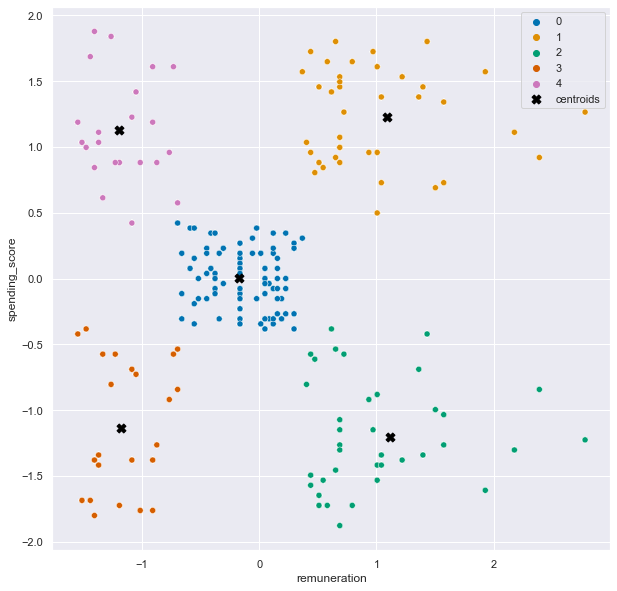

In [90]:
# Create a scatterplot with Seaborn.
sns.scatterplot(x='remuneration',
                y='spending_score',
                data=df2,
                hue=clusters_5,
                palette='colorblind')

# Add centroids.
plt.scatter(kmeans_5.cluster_centers_[:, 0],
            kmeans_5.cluster_centers_[:, 1],
            marker="X",
            c="black",
            s=80,
            label="centroids")
plt.legend(bbox_to_anchor=(1, 1))

# View the plot.
plt.show()

## 7. Discuss: Insights and observations

In [91]:
# View original DataFrame.
reviews_final.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [92]:
# Concat selected columns from the original (reviews_final) DataFrame and with K-Means Predicted column from the 
# final (x) DataFrame.
x_final = pd.concat([reviews_final[['gender', 'age', 'remuneration', 'spending_score',
                                   'loyalty_points', 'education']], x['K-Means Predicted']],
                    axis=1)

# View DataFrame.
x_final.head()

,gender,age,remuneration,spending_score,loyalty_points,education,K-Means Predicted
0,Male,18,12.30,39,210,graduate,3
1,Male,23,12.30,81,524,graduate,4
2,Female,22,13.12,6,40,graduate,3
3,Female,25,13.12,77,562,graduate,4
4,Female,33,13.94,40,366,graduate,3


In [93]:
# Select rows with K-Means Predicted = 0 (Cluster 0).
x_final_0 = x_final[x_final['K-Means Predicted'] == 0]

# Descriptive statistics. 
x_final_0.describe()

,age,remuneration,spending_score,loyalty_points,K-Means Predicted
count,744.000000,744.000000,744.000000,744.000000,744.0
mean,42.364247,44.133414,50.065860,1427.893817,0.0
std,15.905351,6.594620,6.010284,320.324416,0.0
min,17.000000,31.980000,40.000000,603.000000,0.0
25%,29.000000,38.540000,46.000000,1220.250000,0.0
50%,41.000000,44.280000,50.000000,1395.000000,0.0
75%,52.250000,50.020000,55.000000,1651.000000,0.0
max,72.000000,56.580000,61.000000,2332.000000,0.0


In [94]:
# View customers gender ratio in Cluster 0.
print(x_final_0['gender'].value_counts(), '\n')

# View customers education level ratio in Cluster 0.
print(x_final_0['education'].value_counts())

# View customers education level ratio in %% in Cluster 0.
x_final_0['education'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Female    432
Male      312
Name: gender, dtype: int64 

graduate        325
postgraduate    175
PhD             164
diploma          69
Basic            11
Name: education, dtype: int64


graduate        43.68%
postgraduate    23.52%
PhD             22.04%
diploma          9.27%
Basic            1.48%
Name: education, dtype: object

In [95]:
# Select rows with K-Means Predicted = 1 (Cluster 1).
x_final_1 = x_final[x_final['K-Means Predicted'] == 1]

# Descriptive statistics. 
x_final_1.describe()

,age,remuneration,spending_score,loyalty_points,K-Means Predicted
count,356.000000,356.000000,356.000000,356.000000,356.0
mean,35.592697,73.240281,82.008427,3988.238764,1.0
std,7.299612,13.557856,9.342765,898.409322,0.0
min,18.000000,56.580000,63.000000,2289.000000,1.0
25%,32.000000,63.140000,74.000000,3218.000000,1.0
50%,34.000000,71.340000,83.000000,3866.000000,1.0
75%,38.000000,81.180000,90.000000,4635.000000,1.0
max,72.000000,112.340000,97.000000,6847.000000,1.0


In [96]:
# View customers gender ratio in Cluster 1.
print(x_final_1['gender'].value_counts(), '\n')

# View customers education level ratio in Cluster 1.
print(x_final_1['education'].value_counts())

# View customers education level ratio in %% in Cluster 1.
x_final_1['education'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Female    196
Male      160
Name: gender, dtype: int64 

graduate        190
postgraduate     61
PhD              61
diploma          27
Basic            17
Name: education, dtype: int64


graduate        53.37%
postgraduate    17.13%
PhD             17.13%
diploma          7.58%
Basic            4.78%
Name: education, dtype: object

In [97]:
# Select rows with K-Means Predicted = 2 (Cluster 2).
x_final_2 = x_final[x_final['K-Means Predicted'] == 2]

# Descriptive statistics. 
x_final_2.describe()

,age,remuneration,spending_score,loyalty_points,K-Means Predicted
count,351.000000,351.000000,351.000000,351.000000,351.0
mean,40.227920,73.935499,18.555556,941.888889,2.0
std,11.238425,13.699675,10.280726,544.370910,0.0
min,17.000000,57.400000,1.000000,40.000000,2.0
25%,34.500000,63.960000,11.000000,500.000000,2.0
50%,39.000000,71.340000,17.000000,925.000000,2.0
75%,45.000000,82.820000,26.000000,1345.000000,2.0
max,72.000000,112.340000,40.000000,2325.000000,2.0


In [98]:
# View customers gender ratio in Cluster 2.
print(x_final_2['gender'].value_counts(), '\n')

# View customers education level ratio in Cluster 2.
print(x_final_2['education'].value_counts())

# View customers education level ratio in %% in Cluster 2.
x_final_2['education'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Male      180
Female    171
Name: gender, dtype: int64 

graduate        137
PhD              98
postgraduate     72
diploma          26
Basic            18
Name: education, dtype: int64


graduate        39.03%
PhD             27.92%
postgraduate    20.51%
diploma          7.41%
Basic            5.13%
Name: education, dtype: object

In [99]:
# Select rows with K-Means Predicted = 3 (Cluster 3).
x_final_3 = x_final[x_final['K-Means Predicted'] == 3]

# Descriptive statistics. 
x_final_3.describe()

,age,remuneration,spending_score,loyalty_points,K-Means Predicted
count,280.000000,280.000000,280.000000,280.000000,280.0
mean,43.496429,20.795786,20.285714,292.292857,3.0
std,13.828701,5.985730,12.786802,217.682630,0.0
min,17.000000,12.300000,3.000000,25.000000,3.0
25%,37.000000,15.580000,6.000000,79.000000,3.0
50%,43.000000,19.680000,15.000000,238.000000,3.0
75%,52.000000,24.600000,32.000000,456.500000,3.0
max,72.000000,31.980000,40.000000,854.000000,3.0


In [100]:
# View customers gender ratio in Cluster 3.
print(x_final_3['gender'].value_counts(), '\n')

# View customers education level ratio in Cluster 3.
print(x_final_3['education'].value_counts())

# View customers education level ratio in %% in Cluster 3.
x_final_3['education'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Female    170
Male      110
Name: gender, dtype: int64 

graduate        114
PhD              66
diploma          58
postgraduate     39
Basic             3
Name: education, dtype: int64


graduate        40.71%
PhD             23.57%
diploma         20.71%
postgraduate    13.93%
Basic            1.07%
Name: education, dtype: object

In [101]:
# Select rows with K-Means Predicted = 4 (Cluster 4).
x_final_4 = x_final[x_final['K-Means Predicted'] == 4]

# Descriptive statistics. 
x_final_4.describe()

,age,remuneration,spending_score,loyalty_points,K-Means Predicted
count,269.000000,269.000000,269.000000,269.000000,269.0
mean,31.602230,20.353680,79.416357,971.944238,4.0
std,10.731534,5.737253,10.395781,296.173785,0.0
min,17.000000,12.300000,61.000000,436.000000,4.0
25%,24.000000,15.580000,73.000000,724.000000,4.0
50%,29.000000,19.680000,77.000000,969.000000,4.0
75%,37.000000,24.600000,87.000000,1152.000000,4.0
max,71.000000,31.980000,99.000000,1851.000000,4.0


In [102]:
# View customers gender ratio in Cluster 4.
print(x_final_4['gender'].value_counts(), '\n')

# View customers education level ratio in Cluster 4.
print(x_final_4['education'].value_counts())

# View customers education level ratio in %% in Cluster 4.
x_final_4['education'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Female    151
Male      118
Name: gender, dtype: int64 

graduate        134
PhD              71
postgraduate     53
diploma          10
Basic             1
Name: education, dtype: int64


graduate        49.81%
PhD             26.39%
postgraduate     19.7%
diploma          3.72%
Basic            0.37%
Name: education, dtype: object

#### **INSIGHTS AND OBSERVATIONS**

**a) by cluster:**

**Cluster sizes:**

- Cluster 0 - 744 customers;
- Cluster 1 - 356 customers;
- Cluster 2 - 351 customers;
- Cluster 3 - 280 customers;
- Cluster 4 - 269 customers.

**Age group:**

Similar for all clusters.

**Remuneration:**

- Cluster 0 - between £31.98k and £56.58k;
- Cluster 1 and 2 are similar - between £56.58k(cluster 1)/ £57.40k(cluster 2) and £112.34k; 
- Cluster 3 and 4 - between £12.30k and £31.98k.

**Spending score:**

- Cluster 0 - between 40 and 61;
- Cluster 1 and 4 are similar - 63(cluster 1)/ between 61(cluster 4) and 97(cluster 1)/ 99(cluster 4);
- Cluster 2 and 3 are similar - between 1(cluster 2)/ 3(cluster 3) and 40.

**Loyalty points:**

- Cluster 0 - between 603 and 2332;
- Cluster 1 - between 2289 and 6847;
- Cluster 2 - between 40 and 2325;
- Cluster 3 - between 25 and 854;
- Cluster 4 - between 436 and 1851.

Customers with the lowest number of loyalty points have been grouped in cluster 3; customers with the highest number of loyalty points have been grouped in cluster 1.

**Gender ratio:**

Clusters 2 is the only cluster with higher number of male than female customers.

**Education level ratio:**

- The lowest %% of customers with graduate level of education is in cluster 2.
- The highest %% of customers with PhD level of education is in cluster 2.
- The lowest %% and absolute number of customers with the basic level of education is in cluster 4.

**b) overall/summary:**

**Cluster 0** is the largest cluster identified. It contains 37.20% of all customers included in the data set. Customers included in this cluster have spendings from the middle remuneration bracket identified (£31.98k-£56.58k) and the spending scores from the middle spending score bracket identified (40-61). 

**Cluster 1** is the second largest cluster identified. It contains 17.80% of all customers. Customers included in this cluster have spendings from the high remuneration bracket identified (£56.58k-£112.34k) and the spending scores from the high spending score bracket identified (63-97). Customers in this cluster also have the highest number of loyalty points (2289-6847) in the data set.  

**Cluster 2** is similar in size to cluster 1 and contains 17.55% of all customers. Customers included in this cluster, similarly to customers from cluster 1, have spendings from the high remuneration bracket identified (£57.40k-£112.34k) but, unlike customers from cluster 1, have the spending scores from the low spending score bracket identified (1-40). This is the only identified cluster with the higher number of male than female customers. 

**Cluster 3** contains 14.00% of all customers. Customers included in this cluster have spendings from the low remuneration bracket identified (£12.30k-£31.98k) and, similarly to customers from cluster 2, have the spending scores from the low spending score bracket identified (3-40). Customers in this cluster also have the lowest number of loyalty points (25-854) in the data set.  

**Cluster 4** is similar in size to cluster 3 and overall the smallest cluster identified. It contains 13.45% of all customers. Customers included in this cluster, similarly to customers from cluster 3, have spendings from the low remuneration bracket identified (£12.30k-£31.98k) but, unlike customers from cluster 3, have the spending scores from the high spending score bracket identified (61-99). This cluster contains the lowest percentage and absolute number of customers with the basic level of education.

# 

# Week 3 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

## Instructions
1. Load and explore the data. 
    1. Sense-check the DataFrame.
    2. You only need to retain the `review` and `summary` columns.
    3. Determine if there are any missing values.
2. Prepare the data for NLP
    1. Change to lower case and join the elements in each of the columns respectively (`review` and `summary`).
    2. Replace punctuation in each of the columns respectively (`review` and `summary`).
    3. Drop duplicates in both columns (`review` and `summary`).
3. Tokenise and create wordclouds for the respective columns (separately).
    1. Create a copy of the DataFrame.
    2. Apply tokenisation on both columns.
    3. Create and plot a wordcloud image.
4. Frequency distribution and polarity.
    1. Create frequency distribution.
    2. Remove alphanumeric characters and stopwords.
    3. Create wordcloud without stopwords.
    4. Identify 15 most common words and polarity.
5. Review polarity and sentiment.
    1. Plot histograms of polarity (use 15 bins) for both columns.
    2. Review the sentiment scores for the respective columns.
6. Identify and print the top 20 positive and negative reviews and summaries respectively.
7. Include your insights and observations.

## 1. Load and explore the data

In [103]:
# Import all the necessary packages.
import pandas as pd
import numpy as np
import nltk 
import os 
import matplotlib.pyplot as plt

# nltk.download ('punkt').
# nltk.download ('stopwords').

from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from textblob import TextBlob
from scipy.stats import norm
from nltk.corpus import words
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Import Counter.
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

In [104]:
# Load the data set as df3.
df3 = pd.read_csv('reviews_final.csv', index_col=0)

# View DataFrame.
df3.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [105]:
# Explore data set.
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product_code    2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 156.2+ KB


In [106]:
# Keep necessary columns. Drop unnecessary columns.
df3.drop(columns=['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points', 'education', 
                  'product_code'],
         axis=1,
         inplace=True)

# View DataFrame.
df3

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap
...,...,...
1995,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Great game. Did not think I would like it whe...,Super fun
1997,Great game for all.........\nKeeps the mind ni...,Great Game
1998,fun game!,Four Stars


In [107]:
# Determine if there are any missing values.
df3.isnull().sum()

review     0
summary    0
dtype: int64

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [108]:
# Review: Change all to lower case and join with a space.
df3['review'] = df3['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# View output.
df3['review'].head()

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
3    amazing buy! bought it as a gift for our new d...
4    as my review of gf9's previous screens these w...
Name: review, dtype: object

In [109]:
# Summary: Change all to lower case and join with a space.
df3['summary'] = df3['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# View output.
df3['summary'].head()

0    the fact that 50% of this space is wasted on a...
1    another worthless dungeon master's screen from...
2                      pretty, but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [110]:
# Replace all the punctuations in review column.
df3['review'] = df3['review'].str.replace('[^\w\s]','')

# View output.
df3['review'].head()

0    when it comes to a dms screen the space on the...
1    an open letter to galeforce9 your unpainted mi...
2    nice art nice printing why two panels are fill...
3    amazing buy bought it as a gift for our new dm...
4    as my review of gf9s previous screens these we...
Name: review, dtype: object

In [111]:
# Replace all the puncuations in summary column.
df3['summary'] = df3['summary'].str.replace('[^\w\s]','')

# View output.
df3['summary'].head()

0    the fact that 50 of this space is wasted on ar...
1    another worthless dungeon masters screen from ...
2                       pretty but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2c) Drop duplicates in both columns

In [112]:
# Check the number of duplicate values in the df3 DataFrame.
print('Number of duplicates:', df3.duplicated().sum(), 'in number of observations:',df3.shape[0])
df3[df3.duplicated(keep=False)].sort_values('review')

Number of duplicates: 39 in number of observations: 2000


,review,summary
1435,as expected,five stars
1651,as expected,five stars
1553,as expected,five stars
933,awesome,five stars
1037,awesome,five stars
1577,awesome game,five stars
1383,awesome game,five stars
954,best game ever,five stars
1322,best game ever,five stars
1531,cute,five stars


In [113]:
# Drop duplicates in both columns.
df3 = df3.drop_duplicates().reset_index(drop=True)

# View DataFrame.
print(df3.shape)
df3

(1961, 2)


,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap
...,...,...
1956,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom
1957,great game did not think i would like it when ...,super fun
1958,great game for all keeps the mind nimble,great game
1959,fun game,four stars


## 3. Tokenise and create wordclouds

In [114]:
# Create new DataFrame (copy DataFrame).
df3_1 = df3.copy()

# View DataFrame.
df3_1.head()

,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap


In [115]:
# Apply tokenisation to both columns.
df3_1['review'] = df3_1['review'].apply(word_tokenize)
df3_1['summary'] = df3_1['summary'].apply(word_tokenize)

# View DataFrame.
df3_1.head()

,review,summary
0,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"


In [116]:
# Review: Create a word cloud.
# Define an empty string variable.
all_review_tokens = []

# Combine words from lists in each cell of 'review' column in one list of words.
for i in range(df3_1.shape[0]):
    # Add each token to the list.
    all_review_tokens = all_review_tokens + df3_1['review'][i]
    
# Define an empty string variable.
all_review_string = ''

# Convert created 'all_review_tokens' list of individual words in one string.
for i in all_review_tokens:
    # Add each filtered token word to the string.
    all_review_string = all_review_string + i + ' '
    
# View the output.
all_review_string

'when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completely an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could 

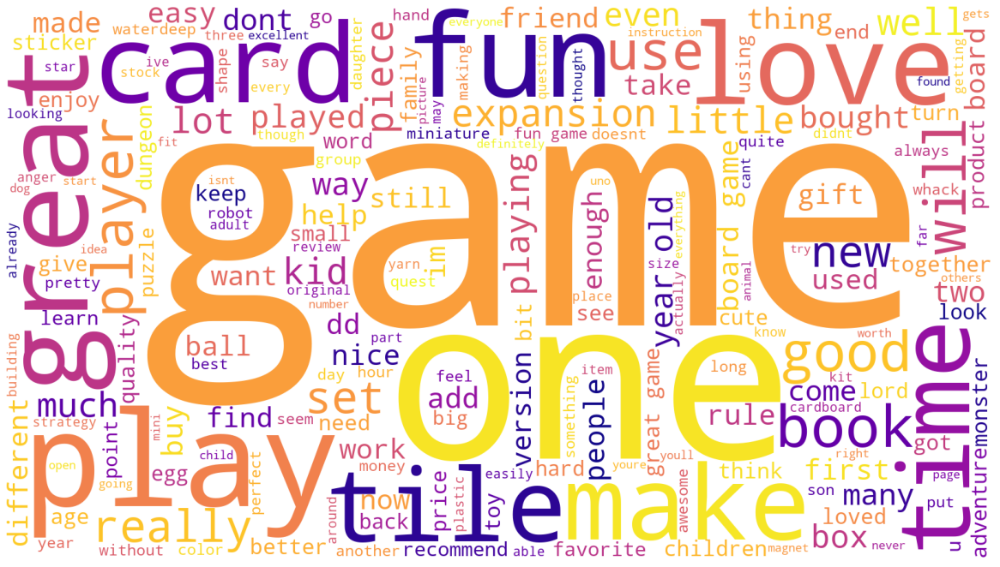

In [117]:
# Review: Plot the WordCloud image.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_review_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

In [118]:
# Summary: Create a word cloud.
# Define an empty string variable.
all_summary_tokens = []

# Combine words from lists in each cell of 'summary' column in one list of words.
for i in range(df3_1.shape[0]):
    # Add each token to the list.
    all_summary_tokens = all_summary_tokens + df3_1['summary'][i]
    
# Define an empty string variable.
all_summary_string = ''

# Convert created 'all_summary_tokens' list of individual words in one string.
for i in all_summary_tokens:
    # Add each filtered token word to the string.
    all_summary_string = all_summary_string + i + ' '
    
# View the output.
all_summary_string

'the fact that 50 of this space is wasted on art and not terribly informative or needed art another worthless dungeon masters screen from galeforce9 pretty but also pretty useless five stars money trap five stars best gm screen ever five stars great but could be even better another missed opportunity not a value add to the product line five stars love the map not a general dm screen very weak game fell completely flat five stars good book buckley was a card mommer very advanced but as good as it gets you better know what youre getting into dont bother the worst value ive ever seen not enough product good product but temporary tattoos were good gift huge hit gorgeous pictures five stars wonderful designs wow great coloring book nice book great pictures perfect well done my relaxation beautiful coloring book the pictures are great ive done one and gave it to a great buy cant wait to work on this book stained glass perfection four stars so beautiful great pictures very nice five stars fiv

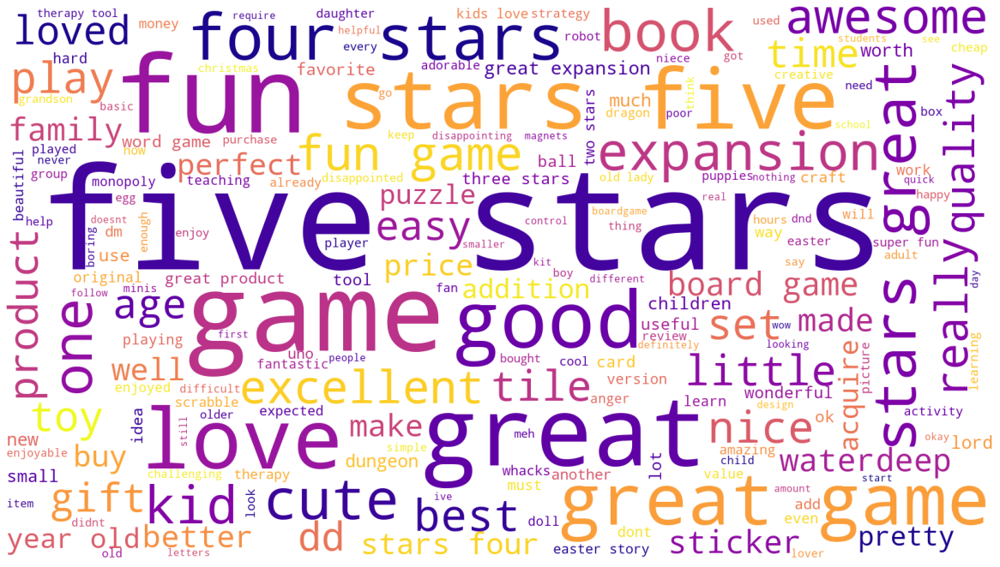

In [119]:
# Summary: Plot the WordCloud image.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_summary_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [120]:
# Determine the frequency distribution for 'review' column.
fdist_review = FreqDist(all_review_tokens)

# Preview data.
fdist_review

FreqDist({'the': 5451, 'and': 3233, 'to': 3162, 'a': 3160, 'of': 2488, 'i': 2090, 'it': 2083, 'is': 1782, 'this': 1776, 'game': 1671, ...})

In [121]:
# Determine the frequency distribution for 'summary' column.
fdist_summary = FreqDist(all_summary_tokens)

# Preview data.
fdist_summary

FreqDist({'stars': 427, 'five': 342, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

### 4b) Remove non-alphanumeric characters and stopwords

In [122]:
# Delete all non-alpanum characters in 'all_review_tokens' list.
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
review_tokens = [word for word in all_review_tokens if word.isalnum()]

# View output.
review_tokens

['when',
 'it',
 'comes',
 'to',
 'a',
 'dms',
 'screen',
 'the',
 'space',
 'on',
 'the',
 'screen',
 'itself',
 'is',
 'at',
 'an',
 'absolute',
 'premium',
 'the',
 'fact',
 'that',
 '50',
 'of',
 'this',
 'space',
 'is',
 'wasted',
 'on',
 'art',
 'and',
 'not',
 'terribly',
 'informative',
 'or',
 'needed',
 'art',
 'as',
 'well',
 'makes',
 'it',
 'completely',
 'useless',
 'the',
 'only',
 'reason',
 'that',
 'i',
 'gave',
 'it',
 '2',
 'stars',
 'and',
 'not',
 '1',
 'was',
 'that',
 'technically',
 'speaking',
 'it',
 'can',
 'at',
 'least',
 'still',
 'stand',
 'up',
 'to',
 'block',
 'your',
 'notes',
 'and',
 'dice',
 'rolls',
 'other',
 'than',
 'that',
 'it',
 'drops',
 'the',
 'ball',
 'completely',
 'an',
 'open',
 'letter',
 'to',
 'galeforce9',
 'your',
 'unpainted',
 'miniatures',
 'are',
 'very',
 'not',
 'bad',
 'your',
 'spell',
 'cards',
 'are',
 'great',
 'your',
 'board',
 'games',
 'are',
 'meh',
 'your',
 'dm',
 'screens',
 'however',
 'are',
 'freaking',
 't

In [123]:
# Delete all non-alpanum characters in 'all_summary_tokens' list.
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
summary_tokens = [word for word in all_summary_tokens if word.isalnum()]

# View output.
summary_tokens

['the',
 'fact',
 'that',
 '50',
 'of',
 'this',
 'space',
 'is',
 'wasted',
 'on',
 'art',
 'and',
 'not',
 'terribly',
 'informative',
 'or',
 'needed',
 'art',
 'another',
 'worthless',
 'dungeon',
 'masters',
 'screen',
 'from',
 'galeforce9',
 'pretty',
 'but',
 'also',
 'pretty',
 'useless',
 'five',
 'stars',
 'money',
 'trap',
 'five',
 'stars',
 'best',
 'gm',
 'screen',
 'ever',
 'five',
 'stars',
 'great',
 'but',
 'could',
 'be',
 'even',
 'better',
 'another',
 'missed',
 'opportunity',
 'not',
 'a',
 'value',
 'add',
 'to',
 'the',
 'product',
 'line',
 'five',
 'stars',
 'love',
 'the',
 'map',
 'not',
 'a',
 'general',
 'dm',
 'screen',
 'very',
 'weak',
 'game',
 'fell',
 'completely',
 'flat',
 'five',
 'stars',
 'good',
 'book',
 'buckley',
 'was',
 'a',
 'card',
 'mommer',
 'very',
 'advanced',
 'but',
 'as',
 'good',
 'as',
 'it',
 'gets',
 'you',
 'better',
 'know',
 'what',
 'youre',
 'getting',
 'into',
 'dont',
 'bother',
 'the',
 'worst',
 'value',
 'ive',
 'e

In [124]:
# Remove all the stopwords from 'review_tokens' list.
# Create a set of English stop words.
english_stopwords = set(stopwords.words('english'))

# Create a filtered list of tokens without stop words.
review_tokens1 = [x for x in review_tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
review_tokens1_string = ''

# Convert created 'review_tokens1' list of individual words in one string.
for i in review_tokens1:
    # Add each filtered token word to the string.
    review_tokens1_string = review_tokens1_string + i + ' '
    
# View output.
review_tokens1_string

'comes dms screen space screen absolute premium fact 50 space wasted art terribly informative needed art well makes completely useless reason gave 2 stars 1 technically speaking least still stand block notes dice rolls drops ball completely open letter galeforce9 unpainted miniatures bad spell cards great board games meh dm screens however freaking terrible im still waiting single screen isnt polluted pointless artwork useful referenceable tables youve created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens nice art nice printing two panels filled general forgotten realms map beyond one blue ocean waste dont understand cant make dm screens useful kinds adventures rather solely specific adventure youre supposed able transpose adventure lands outside forgot

In [125]:
# Remove all the stopwords from 'summary_tokens' list.

# Create a filtered list of tokens without stop words.
summary_tokens1 = [x for x in summary_tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
summary_tokens1_string = ''

# Convert created 'summary_tokens1' list of individual words in one string.
for i in summary_tokens1:
    # Add each filtered token word to the string.
    summary_tokens1_string = summary_tokens1_string + i + ' '
    
# View output.
summary_tokens1_string

'fact 50 space wasted art terribly informative needed art another worthless dungeon masters screen galeforce9 pretty also pretty useless five stars money trap five stars best gm screen ever five stars great could even better another missed opportunity value add product line five stars love map general dm screen weak game fell completely flat five stars good book buckley card mommer advanced good gets better know youre getting dont bother worst value ive ever seen enough product good product temporary tattoos good gift huge hit gorgeous pictures five stars wonderful designs wow great coloring book nice book great pictures perfect well done relaxation beautiful coloring book pictures great ive done one gave great buy cant wait work book stained glass perfection four stars beautiful great pictures nice five stars five stars five stars five stars five stars five stars four stars three stars like every image contained stained glass coloring book creative stained glass pictures nice pictures

### 4c) Create wordclouds without stopwords

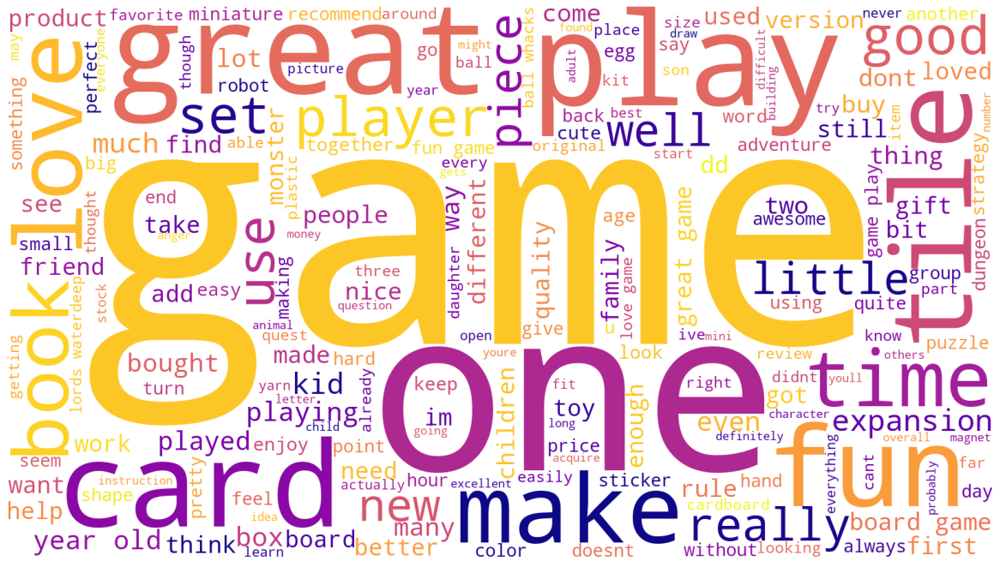

In [126]:
# Create a wordcloud without stop words for 'review' column.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(review_tokens1_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

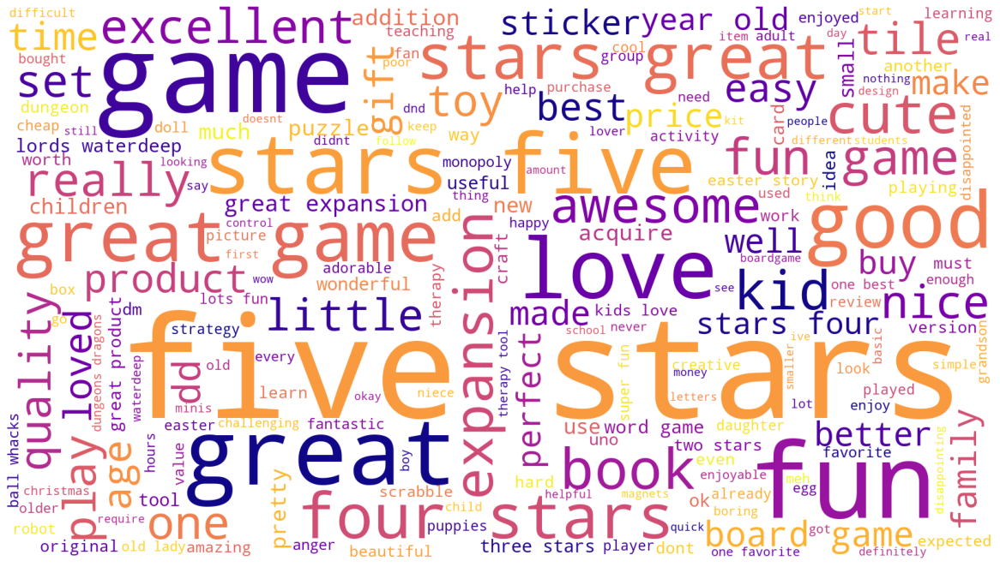

In [127]:
# Create a wordcloud without stop words for 'summary' column.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(summary_tokens1_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

### 4d) Identify 15 most common words and polarity

In [128]:
# Determine the 15 most common words from 'review' column after removing duplicates, non-alphanumeric characters 
# and stopwords.
Counter(review_tokens1).most_common(15)

[('game', 1671),
 ('great', 580),
 ('fun', 552),
 ('one', 530),
 ('play', 502),
 ('like', 414),
 ('love', 323),
 ('really', 319),
 ('get', 319),
 ('cards', 301),
 ('tiles', 297),
 ('time', 291),
 ('good', 289),
 ('would', 280),
 ('book', 273)]

In [129]:
# Generate a DataFrame from Counter (for 15 most common words in the 'review' column).
counts_review = pd.DataFrame(Counter(review_tokens1).most_common(15),
                             columns=['Word', 'Frequency'])

# Preview data.
counts_review

,Word,Frequency
0,game,1671
1,great,580
2,fun,552
3,one,530
4,play,502
5,like,414
6,love,323
7,really,319
8,get,319
9,cards,301


In [130]:
# Define a function to extract a polarity score.
def generate_polarity(comment):
    return TextBlob(comment).sentiment[0]

# Populate a new column with polarity scores for each of the 15 most common words identified in the 'review' column.
counts_review['Polarity'] = counts_review['Word'].apply(generate_polarity)

# Preview the result.
print(counts_review.describe())
counts_review

         Frequency   Polarity
count    15.000000  15.000000
mean    462.733333   0.140000
std     351.893342   0.313506
min     273.000000  -0.400000
25%     294.000000   0.000000
50%     319.000000   0.000000
75%     516.000000   0.250000
max    1671.000000   0.800000


,Word,Frequency,Polarity
0,game,1671,-0.4
1,great,580,0.8
2,fun,552,0.3
3,one,530,0.0
4,play,502,0.0
5,like,414,0.0
6,love,323,0.5
7,really,319,0.2
8,get,319,0.0
9,cards,301,0.0


In [131]:
# Determine the 15 most common words from 'summary' column after removing duplicates, non-alphanumeric characters 
# and stopwords.
Counter(summary_tokens1).most_common(15)

[('stars', 427),
 ('five', 342),
 ('game', 319),
 ('great', 295),
 ('fun', 218),
 ('love', 93),
 ('good', 92),
 ('four', 58),
 ('like', 54),
 ('expansion', 52),
 ('kids', 50),
 ('cute', 45),
 ('book', 43),
 ('one', 38),
 ('awesome', 36)]

In [132]:
# Generate a DataFrame from Counter (for 15 most common words in the 'summary' column).
counts_summary = pd.DataFrame(Counter(summary_tokens1).most_common(15),
                              columns=['Word', 'Frequency'])

# Preview data.
counts_summary

,Word,Frequency
0,stars,427
1,five,342
2,game,319
3,great,295
4,fun,218
5,love,93
6,good,92
7,four,58
8,like,54
9,expansion,52


In [133]:
# Populate a new column with polarity scores for each of the 15 most common words identified in the 'summary' column.
counts_summary['Polarity'] = counts_summary['Word'].apply(generate_polarity)

# Preview the result.
print(counts_summary.describe())
counts_summary

        Frequency   Polarity
count   15.000000  15.000000
mean   144.133333   0.226667
std    136.066615   0.388158
min     36.000000  -0.400000
25%     47.500000   0.000000
50%     58.000000   0.000000
75%    256.500000   0.500000
max    427.000000   1.000000


,Word,Frequency,Polarity
0,stars,427,0.0
1,five,342,0.0
2,game,319,-0.4
3,great,295,0.8
4,fun,218,0.3
5,love,93,0.5
6,good,92,0.7
7,four,58,0.0
8,like,54,0.0
9,expansion,52,0.0


## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [134]:
# Populate a new column with polarity scores for each review.
df3['polarity_r'] = df3['review'].apply(generate_polarity)

# Preview the result.
df3['polarity_r'].head()

0   -0.036111
1    0.035952
2    0.116640
3    0.578788
4   -0.316667
Name: polarity_r, dtype: float64

In [135]:
# Get a list of all english words so we can exclude anything that doesnt appear on the list.
all_english_words = set(words.words())

# Convert tokenised 'review' column into a list which includes sub-lists of rewies devided by a word.
review_list = df3_1['review'].values.tolist()

# Some pre-processing:
#-- lets get every word
#-- lets convert it to lowercase
#-- only include if the word is alphanumeric and if it is in the list of English words.
review_list1 = [[y.lower() for y in x if y.lower() not in english_stopwords and y.isalpha() and y.lower() 
          in all_english_words] for x in review_list]

# Create a variable to store the sia.
sia = SentimentIntensityAnalyzer()

# Run through a dictionary comprehension to take every cleaned review. 
# Next run the polarity score function on the string.
# This will return four values in a dictionary.

df_polarity = {" ".join(_) : sia.polarity_scores(" ".join(_)) for _ in review_list1}

# Convert the list of dictionary results to a Pandas DataFrame.
# The index is the cleaned tweet.
# We can see some of the highly positive words. 
polarity = pd.DataFrame(df_polarity).T

# View the DataFrame.
polarity.sort_index(ascending=True)

,neg,neu,pos,compound
,0.000,0.000,0.000,0.0000
able implement easily use alongside even size outline get place tile see room theyre,0.000,0.844,0.156,0.3400
absolutely adorable excited teach daughter alphabet fun didnt receive whole alphabet,0.000,0.458,0.542,0.8581
absolutely amazing set first laid kind disappointed like build encounter amazed much actually box,0.123,0.356,0.522,0.8777
absolutely beautiful week school know love plan enjoy home thank beautifully made appreciate gently open first time,0.000,0.299,0.701,0.9735
...,...,...,...,...
younger big make easy play young feature helping learn order twenty,0.000,0.516,0.484,0.7579
youve stuff classic per minute time world devote card sleight hand book seriously truly excellent book though faint heart superb one serious serious card magic book serious get course overlook antiquated prose tremendous ego throughout read material forgive tone splendid work want best,0.088,0.474,0.438,0.9753
yr old along gave perfect project,0.000,0.575,0.425,0.5719
yr old son puzzle nice big,0.000,0.641,0.359,0.4215


In [136]:
# The describe function on the compound will show the distribution. 
# The average (mean) is 0.614 => positive sentiment.
polarity['compound'].describe()

count    1893.000000
mean        0.614441
std         0.378991
min        -0.975600
25%         0.458800
50%         0.742200
75%         0.891000
max         0.998700
Name: compound, dtype: float64

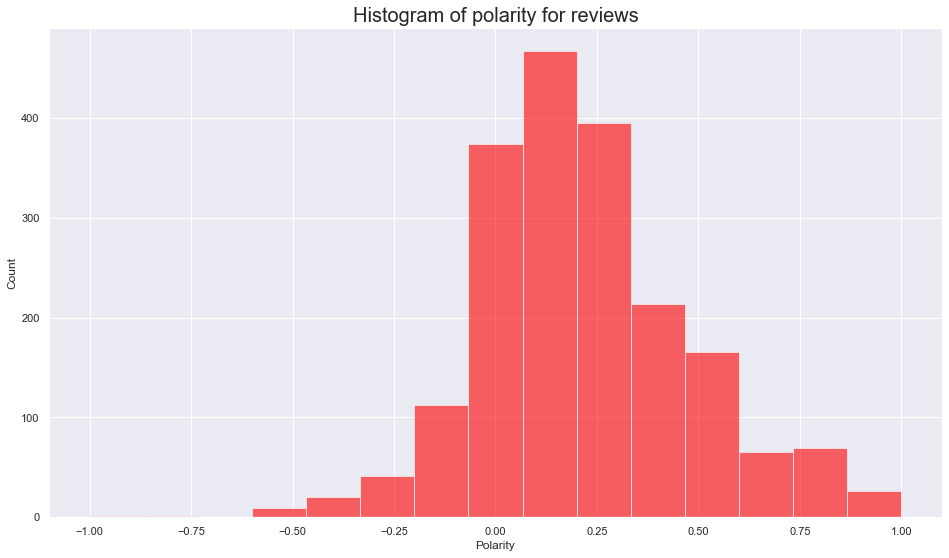

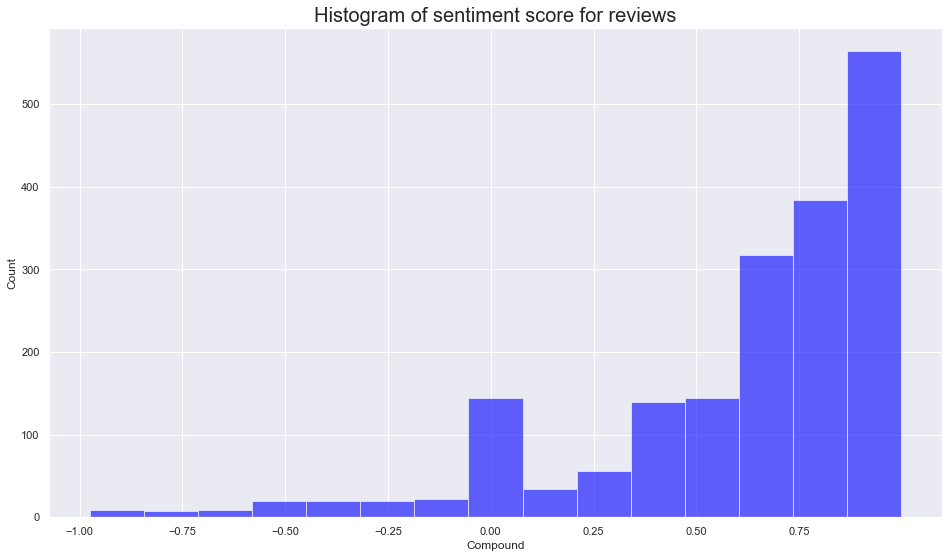

<AxesSubplot:>

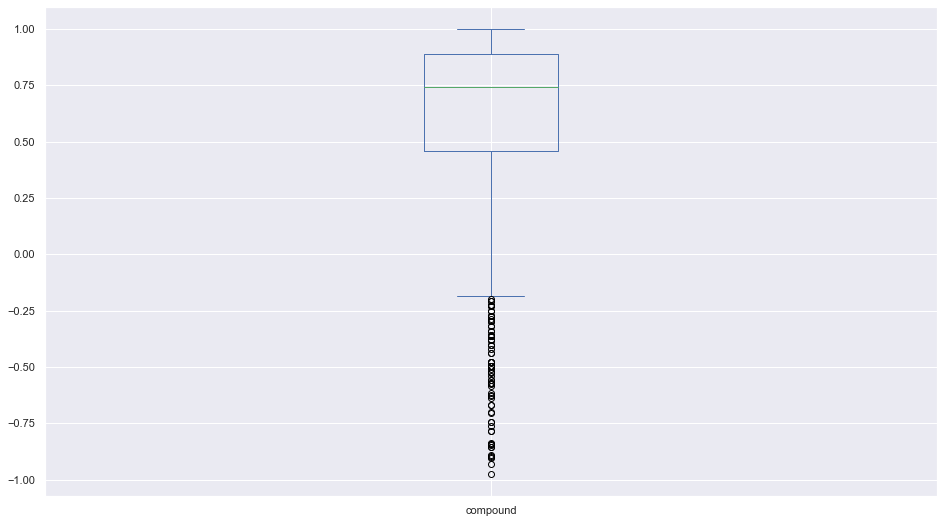

In [137]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3['polarity_r'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of polarity for reviews', fontsize=20)

plt.show()

# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot = polarity.reset_index()['compound'].sort_values()

# Define the bars.
n, bins, patches = plt.hist(plot, num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Compound', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score for reviews', fontsize=20)
plt.xticks(np.arange(-1, 1, step=0.25))

plt.show()

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot.plot(kind='box', figsize=(16,9))

In [138]:
# Populate a new column with polarity scores for each summary.
df3['polarity_s'] = df3['summary'].apply(generate_polarity)

# Preview the result.
df3['polarity_s'].head()

0    0.15
1   -0.80
2    0.00
3    0.00
4    0.00
Name: polarity_s, dtype: float64

In [139]:
# Convert tokenised 'summary' column into a list which includes sub-lists of rewies devided by a word.
summary_list = df3_1['summary'].values.tolist()

# Some pre-processing:
#-- lets get every word
#-- lets convert it to lowercase
#-- only include if the word is alphanumeric and if it is in the list of English words.
summary_list1 = [[y.lower() for y in x if y.lower() not in english_stopwords and y.isalpha() and y.lower() 
          in all_english_words] for x in summary_list]

# Create a variable to store the sia.
sia = SentimentIntensityAnalyzer()

# Run through a dictionary comprehension to take every cleaned review. 
# Next run the polarity score function on the string.
# This will return four values in a dictionary.

df_polarity1 = {" ".join(_) : sia.polarity_scores(" ".join(_)) for _ in summary_list1}

# Convert the list of dictionary results to a Pandas DataFrame.
# The index is the cleaned tweet.
# We can see some of the highly positive words. 
polarity1 = pd.DataFrame(df_polarity1).T

# View the DataFrame.
polarity1.sort_index(ascending=True)

,neg,neu,pos,compound
,0.0,0.000,0.000,0.0000
aam counter offensive,0.6,0.400,0.000,-0.4588
able tell better easter week hope theyll used,0.0,0.508,0.492,0.7003
absolutely adorable excited teach daughter,0.0,0.327,0.673,0.7328
absolutely love,0.0,0.182,0.818,0.6697
...,...,...,...,...
year old sister,0.0,1.000,0.000,0.0000
yes buy wish company,0.0,0.270,0.730,0.6597
yet another dimension already good game,0.0,0.633,0.367,0.4404
young granddaughter fun,0.0,0.377,0.623,0.5106


In [140]:
# The describe function on the compound will show the distribution. 
# The average (mean) is 0.378 => fairly positive sentiment.
polarity1['compound'].describe()

count    1165.000000
mean        0.378276
std         0.343531
min        -0.784500
25%         0.000000
50%         0.493900
75%         0.624900
max         0.952400
Name: compound, dtype: float64

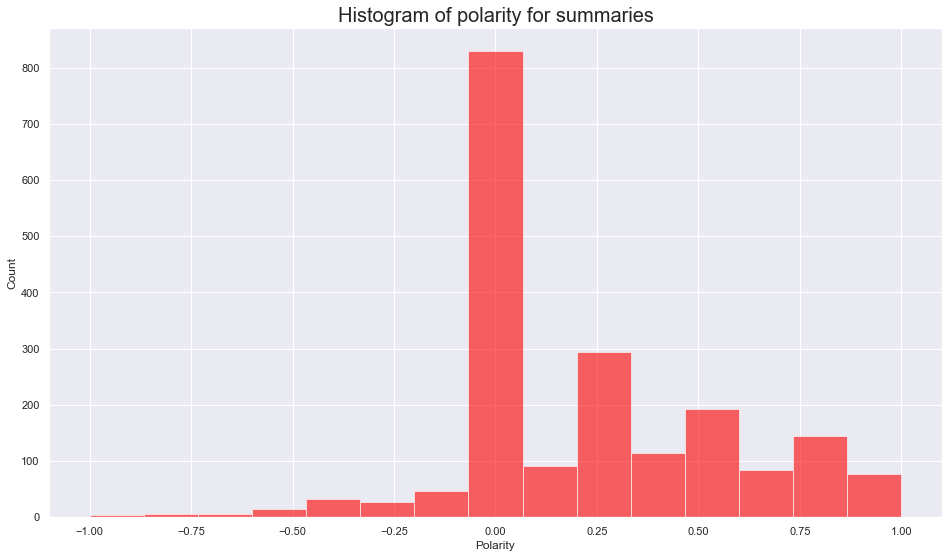

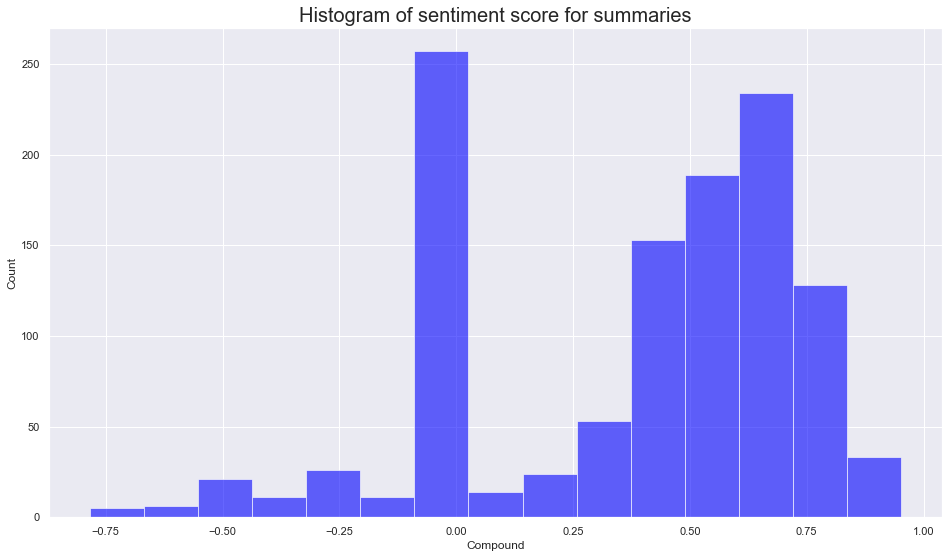

<AxesSubplot:>

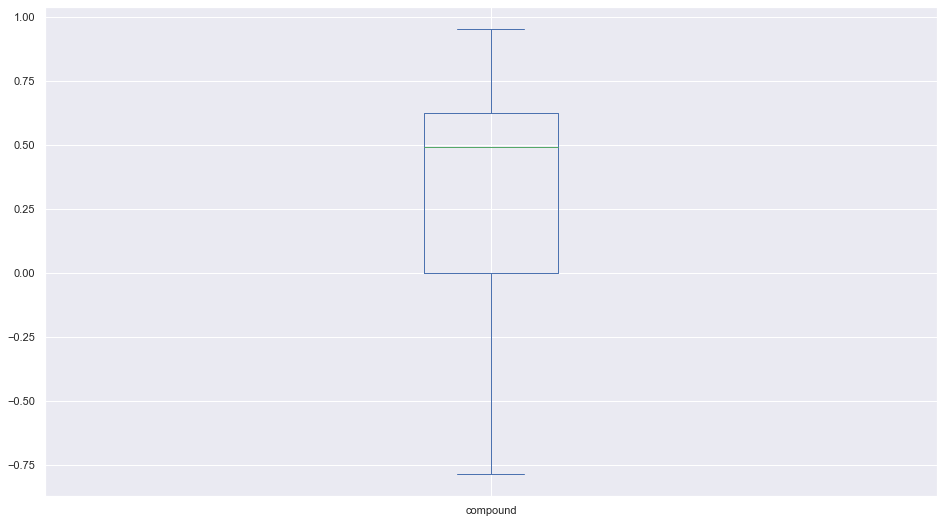

In [141]:
# Summary: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3['polarity_s'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of polarity for summaries', fontsize=20)

plt.show()

# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot1 = polarity1.reset_index()['compound'].sort_values()

# Define the bars.
n, bins, patches = plt.hist(plot1, num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Compound', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score for summaries', fontsize=20)

plt.show()

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot1.plot(kind='box', figsize=(16,9))

## 6. Identify top 20 positive and negative reviews and summaries respectively

In [142]:
# Top 20 negative reviews.
# Create a DataFrame.
negative_sentiment_r = df3.nsmallest(20, 'polarity_r')

# Eliminate unnecessary columns.
negative_sentiment_r = negative_sentiment_r[['review', 'polarity_r']]

# View output.
negative_sentiment_r.style.set_properties(subset=['review'], **{'width': '1200px'})

,review,polarity_r
207,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.000000
181,incomplete kit very disappointing,-0.780000
1773,im sorry i just find this product to be boring and to be frank juvenile,-0.583333
362,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.550000
116,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.500000
226,this was a gift for my daughter i found it difficult to use,-0.500000
229,i found the directions difficult,-0.500000
289,instructions are complicated to follow,-0.500000
300,difficult,-0.500000
1501,expensive for what you get,-0.500000


In [143]:
# Top 20 negative summaries.
# Create a DataFrame.
negative_sentiment_s = df3.nsmallest(20, 'polarity_s')

# Eliminate unnecessary columns.
negative_sentiment_s = negative_sentiment_s[['summary', 'polarity_s']]

# View output.
negative_sentiment_s.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
21,the worst value ive ever seen,-1.000000
207,boring unless you are a craft person which i am,-1.000000
819,boring,-1.000000
1148,before this i hated running any rpg campaign dealing with towns because it,-0.900000
1,another worthless dungeon masters screen from galeforce9,-0.800000
143,disappointed,-0.750000
623,disappointed,-0.750000
785,disappointed,-0.750000
1591,disappointed,-0.750000
361,promotes anger instead of teaching calming methods,-0.700000


In [144]:
# Top 20 positive reviews.
positive_sentiment_r = df3.nlargest(20, 'polarity_r')

# Eliminate unnecessary columns.
positive_sentiment_r = positive_sentiment_r[['review', 'polarity_r']]

# Adjust the column width.
positive_sentiment_r.style.set_properties(subset=['review'], **{'width': '1200px'})

,review,polarity_r
7,came in perfect condition,1.000000
164,awesome book,1.000000
193,awesome gift,1.000000
489,excellent activity for teaching selfmanagement skills,1.000000
517,perfect just what i ordered,1.000000
583,wonderful product,1.000000
601,delightful product,1.000000
613,wonderful for my grandson to learn the resurrection story,1.000000
782,perfect,1.000000
923,awesome,1.000000


In [145]:
# Top 20 positive summaries.
positive_sentiment_s = df3.nlargest(20, 'polarity_s')

# Eliminate unnecessary columns.
positive_sentiment_s = positive_sentiment_s[['summary', 'polarity_s']]

# Adjust the column width.
positive_sentiment_s.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
6,best gm screen ever,1.000000
28,wonderful designs,1.000000
32,perfect,1.000000
80,theyre the perfect size to keep in the car or a diaper,1.000000
133,perfect for preschooler,1.000000
139,awesome sticker activity for the price,1.000000
160,awesome book,1.000000
162,he was very happy with his gift,1.000000
186,awesome,1.000000
209,awesome and welldesigned for 9 year olds,1.000000


**Additional questions**

**1. Investigate duplicates.**

In [146]:
# Load the data set as df3a.
df3a = pd.read_csv('reviews_final.csv', index_col=0)

# View DataFrame.
df3a.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [147]:
# Change all to lower case and join with a space in review and summary columns.
df3a['review'] = df3a['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df3a['summary'] = df3a['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# Replace all the puncuations in review and summary columns.
df3a['review'] = df3a['review'].str.replace('[^\w\s]','')
df3a['summary'] = df3a['summary'].str.replace('[^\w\s]','')

# View DataFrame.
df3a

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,Male,23,12.30,81,524,graduate,466,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,Female,22,13.12,6,40,graduate,254,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,Female,25,13.12,77,562,graduate,263,amazing buy bought it as a gift for our new dm...,five stars
4,Female,33,13.94,40,366,graduate,291,as my review of gf9s previous screens these we...,money trap
...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,977,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom
1996,Female,43,92.66,8,539,PhD,979,great game did not think i would like it when ...,super fun
1997,Male,34,92.66,91,5614,graduate,1012,great game for all keeps the mind nimble,great game
1998,Male,34,98.40,16,1048,PhD,1031,fun game,four stars


In [148]:
# Show rows from the df3a DataFrame which contain duplicates in both, 'review' and 'summary', columns.
df3a[df3a.duplicated(subset=['review', 'summary'], keep=False)].sort_values('review')

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
1435,Female,23,50.84,41,1095,PhD,4459,as expected,five stars
1651,Male,35,20.50,73,1010,postgraduate,4452,as expected,five stars
1553,Female,38,79.54,32,1779,PhD,6431,as expected,five stars
933,Female,33,59.04,71,2750,graduate,4477,awesome,five stars
1037,Female,32,27.88,73,1314,postgraduate,2130,awesome,five stars
1577,Male,29,44.28,54,1461,graduate,1506,awesome game,five stars
1383,Female,29,80.36,88,4320,graduate,1459,awesome game,five stars
954,Female,45,63.96,16,752,PhD,11003,best game ever,five stars
1322,Female,38,56.58,58,2294,graduate,4477,best game ever,five stars
1531,Male,39,79.54,86,4829,postgraduate,4712,cute,five stars


In [149]:
# Show rows from the df3a DataFrame which contain duplicates in 'gender', 'review' and 'summary' columns.
df3a[df3a.duplicated(subset=['gender', 'review', 'summary'], keep=False)].sort_values('review')

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
1435,Female,23,50.84,41,1095,PhD,4459,as expected,five stars
1553,Female,38,79.54,32,1779,PhD,6431,as expected,five stars
933,Female,33,59.04,71,2750,graduate,4477,awesome,five stars
1037,Female,32,27.88,73,1314,postgraduate,2130,awesome,five stars
1322,Female,38,56.58,58,2294,graduate,4477,best game ever,five stars
954,Female,45,63.96,16,752,PhD,11003,best game ever,five stars
1186,Female,53,82.82,24,1469,postgraduate,3711,good,five stars
1933,Female,33,40.18,42,1107,graduate,10995,good,five stars
294,Female,34,49.20,42,1376,graduate,6770,good,five stars
404,Female,33,13.94,40,366,graduate,977,good,five stars


In [150]:
# Show rows from the df3a DataFrame which contain duplicates in 'gender', 'product_code', 'review' and 'summary' 
# columns.
df3a[df3a.duplicated(subset=['gender', 'product_code', 'review', 'summary'], keep=False)].sort_values('review')

# Looking at the data set in total I do not think we have enough evidence to say that deleted in p.6.3.3 had
# to be delited. Therefore, I will re-run the analysis including all data. 

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
811,Female,37,15.58,99,1067,postgraduate,1183,great game,five stars
1006,Female,37,14.76,6,61,diploma,1183,great game,five stars


In [151]:
# Create new DataFrame (copy df3a DataFrame).
df3a_1 = df3a.copy()

# View DataFrame.
df3a_1.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,Male,23,12.30,81,524,graduate,466,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,Female,22,13.12,6,40,graduate,254,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,Female,25,13.12,77,562,graduate,263,amazing buy bought it as a gift for our new dm...,five stars
4,Female,33,13.94,40,366,graduate,291,as my review of gf9s previous screens these we...,money trap


In [152]:
# Apply tokenisation to both columns.
df3a_1['review'] = df3a_1['review'].apply(word_tokenize)
df3a_1['summary'] = df3a_1['summary'].apply(word_tokenize)

# View DataFrame.
df3a_1.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product_code,review,summary
0,Male,18,12.30,39,210,graduate,453,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,Male,23,12.30,81,524,graduate,466,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,Female,22,13.12,6,40,graduate,254,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,Female,25,13.12,77,562,graduate,263,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,Female,33,13.94,40,366,graduate,291,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"


In [153]:
# Review: Create a word cloud.
# Define an empty string variable.
all_review_tokens_a = []

# Combine words from lists in each cell of 'review' column in one list of words.
for i in range(df3a_1.shape[0]):
    # Add each token to the list.
    all_review_tokens_a = all_review_tokens_a + df3a_1['review'][i]
    
# Define an empty string variable.
all_review_string_a = ''

# Convert created 'all_review_tokens_a' list of individual words in one string.
for i in all_review_tokens_a:
    # Add each filtered token word to the string.
    all_review_string_a = all_review_string_a + i + ' '
    
# View the output.
all_review_string_a

'when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completely an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could 

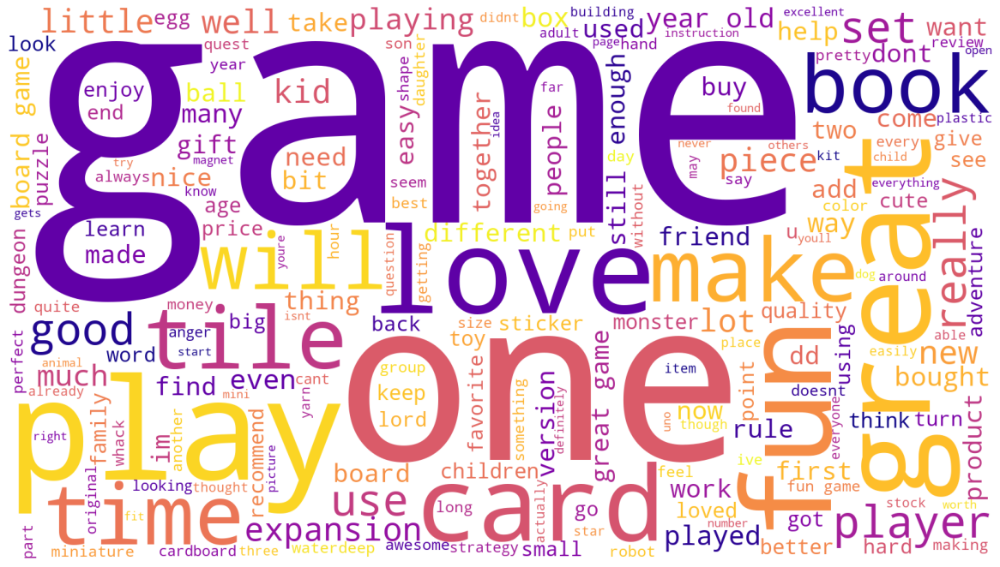

In [154]:
# Review: Plot the WordCloud image.
wordcloud_a = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_review_string_a) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud_a) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

In [155]:
# Summary: Create a word cloud.
# Define an empty string variable.
all_summary_tokens_a = []

# Combine words from lists in each cell of 'summary' column in one list of words.
for i in range(df3a_1.shape[0]):
    # Add each token to the list.
    all_summary_tokens_a = all_summary_tokens_a + df3a_1['summary'][i]
    
# Define an empty string variable.
all_summary_string_a = ''

# Convert created 'all_summary_tokens_a' list of individual words in one string.
for i in all_summary_tokens_a:
    # Add each filtered token word to the string.
    all_summary_string_a = all_summary_string_a + i + ' '
    
# View the output.
all_summary_string_a

'the fact that 50 of this space is wasted on art and not terribly informative or needed art another worthless dungeon masters screen from galeforce9 pretty but also pretty useless five stars money trap five stars best gm screen ever five stars great but could be even better another missed opportunity not a value add to the product line five stars love the map not a general dm screen very weak game fell completely flat five stars good book buckley was a card mommer very advanced but as good as it gets you better know what youre getting into dont bother the worst value ive ever seen not enough product good product but temporary tattoos were good gift huge hit gorgeous pictures five stars wonderful designs wow great coloring book nice book great pictures perfect well done my relaxation beautiful coloring book the pictures are great ive done one and gave it to a great buy cant wait to work on this book stained glass perfection four stars so beautiful great pictures very nice five stars fiv

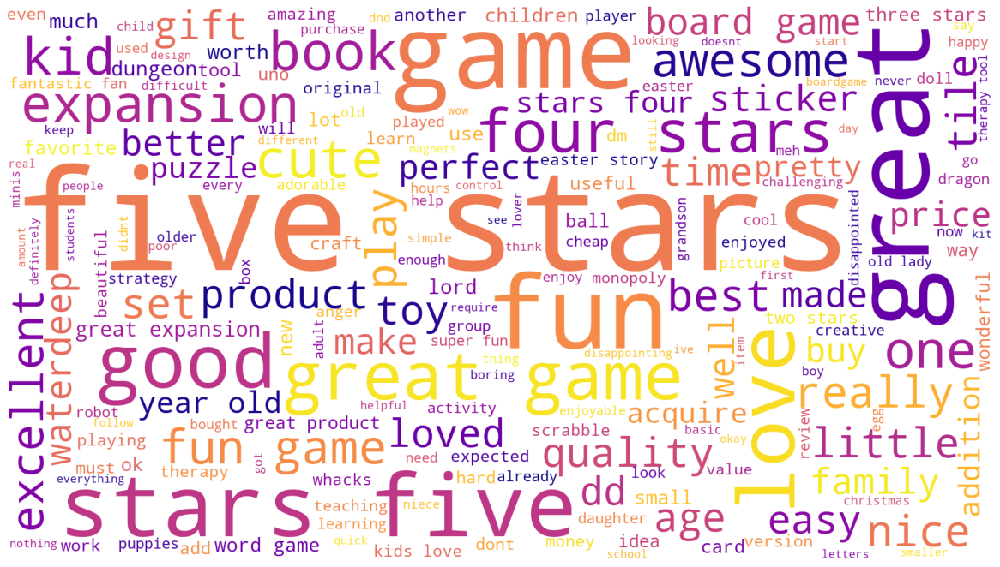

In [156]:
# Summary: Plot the WordCloud image.
wordcloud_a = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_summary_string_a) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud_a) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

In [157]:
# Determine the frequency distribution for 'review' column.
fdist_review_a = FreqDist(all_review_tokens_a)

# Preview data.
fdist_review_a

FreqDist({'the': 5452, 'and': 3234, 'to': 3164, 'a': 3161, 'of': 2488, 'i': 2091, 'it': 2090, 'is': 1782, 'this': 1776, 'game': 1685, ...})

In [158]:
# Determine the frequency distribution for 'summary' column.
fdist_summary_a = FreqDist(all_summary_tokens_a)

# Preview data.
fdist_summary_a

FreqDist({'stars': 466, 'five': 381, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

In [159]:
# Delete all non-alpanum characters in 'all_review_tokens_a' list.
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
review_tokens_a = [word for word in all_review_tokens_a if word.isalnum()]

# View output.
review_tokens_a

['when',
 'it',
 'comes',
 'to',
 'a',
 'dms',
 'screen',
 'the',
 'space',
 'on',
 'the',
 'screen',
 'itself',
 'is',
 'at',
 'an',
 'absolute',
 'premium',
 'the',
 'fact',
 'that',
 '50',
 'of',
 'this',
 'space',
 'is',
 'wasted',
 'on',
 'art',
 'and',
 'not',
 'terribly',
 'informative',
 'or',
 'needed',
 'art',
 'as',
 'well',
 'makes',
 'it',
 'completely',
 'useless',
 'the',
 'only',
 'reason',
 'that',
 'i',
 'gave',
 'it',
 '2',
 'stars',
 'and',
 'not',
 '1',
 'was',
 'that',
 'technically',
 'speaking',
 'it',
 'can',
 'at',
 'least',
 'still',
 'stand',
 'up',
 'to',
 'block',
 'your',
 'notes',
 'and',
 'dice',
 'rolls',
 'other',
 'than',
 'that',
 'it',
 'drops',
 'the',
 'ball',
 'completely',
 'an',
 'open',
 'letter',
 'to',
 'galeforce9',
 'your',
 'unpainted',
 'miniatures',
 'are',
 'very',
 'not',
 'bad',
 'your',
 'spell',
 'cards',
 'are',
 'great',
 'your',
 'board',
 'games',
 'are',
 'meh',
 'your',
 'dm',
 'screens',
 'however',
 'are',
 'freaking',
 't

In [160]:
# Delete all non-alpanum characters in 'all_summary_tokens_a' list.
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
summary_tokens_a = [word for word in all_summary_tokens_a if word.isalnum()]

# View output.
summary_tokens_a

['the',
 'fact',
 'that',
 '50',
 'of',
 'this',
 'space',
 'is',
 'wasted',
 'on',
 'art',
 'and',
 'not',
 'terribly',
 'informative',
 'or',
 'needed',
 'art',
 'another',
 'worthless',
 'dungeon',
 'masters',
 'screen',
 'from',
 'galeforce9',
 'pretty',
 'but',
 'also',
 'pretty',
 'useless',
 'five',
 'stars',
 'money',
 'trap',
 'five',
 'stars',
 'best',
 'gm',
 'screen',
 'ever',
 'five',
 'stars',
 'great',
 'but',
 'could',
 'be',
 'even',
 'better',
 'another',
 'missed',
 'opportunity',
 'not',
 'a',
 'value',
 'add',
 'to',
 'the',
 'product',
 'line',
 'five',
 'stars',
 'love',
 'the',
 'map',
 'not',
 'a',
 'general',
 'dm',
 'screen',
 'very',
 'weak',
 'game',
 'fell',
 'completely',
 'flat',
 'five',
 'stars',
 'good',
 'book',
 'buckley',
 'was',
 'a',
 'card',
 'mommer',
 'very',
 'advanced',
 'but',
 'as',
 'good',
 'as',
 'it',
 'gets',
 'you',
 'better',
 'know',
 'what',
 'youre',
 'getting',
 'into',
 'dont',
 'bother',
 'the',
 'worst',
 'value',
 'ive',
 'e

In [161]:
# Remove all the stopwords from 'review_tokens_a' list.

# Create a filtered list of tokens without stop words.
review_tokens1_a = [x for x in review_tokens_a if x.lower() not in english_stopwords]

# Define an empty string variable.
review_tokens1_string_a = ''

# Convert created 'review_tokens1' list of individual words in one string.
for i in review_tokens1_a:
    # Add each filtered token word to the string.
    review_tokens1_string_a = review_tokens1_string_a + i + ' '
    
# View output.
review_tokens1_string_a

'comes dms screen space screen absolute premium fact 50 space wasted art terribly informative needed art well makes completely useless reason gave 2 stars 1 technically speaking least still stand block notes dice rolls drops ball completely open letter galeforce9 unpainted miniatures bad spell cards great board games meh dm screens however freaking terrible im still waiting single screen isnt polluted pointless artwork useful referenceable tables youve created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens nice art nice printing two panels filled general forgotten realms map beyond one blue ocean waste dont understand cant make dm screens useful kinds adventures rather solely specific adventure youre supposed able transpose adventure lands outside forgot

In [162]:
# Remove all the stopwords from 'summary_tokens_a' list.

# Create a filtered list of tokens without stop words.
summary_tokens1_a = [x for x in summary_tokens_a if x.lower() not in english_stopwords]

# Define an empty string variable.
summary_tokens1_string_a = ''

# Convert created 'summary_tokens1_a' list of individual words in one string.
for i in summary_tokens1_a:
    # Add each filtered token word to the string.
    summary_tokens1_string_a = summary_tokens1_string_a + i + ' '
    
# View output.
summary_tokens1_string_a

'fact 50 space wasted art terribly informative needed art another worthless dungeon masters screen galeforce9 pretty also pretty useless five stars money trap five stars best gm screen ever five stars great could even better another missed opportunity value add product line five stars love map general dm screen weak game fell completely flat five stars good book buckley card mommer advanced good gets better know youre getting dont bother worst value ive ever seen enough product good product temporary tattoos good gift huge hit gorgeous pictures five stars wonderful designs wow great coloring book nice book great pictures perfect well done relaxation beautiful coloring book pictures great ive done one gave great buy cant wait work book stained glass perfection four stars beautiful great pictures nice five stars five stars five stars five stars five stars five stars four stars three stars like every image contained stained glass coloring book creative stained glass pictures nice pictures

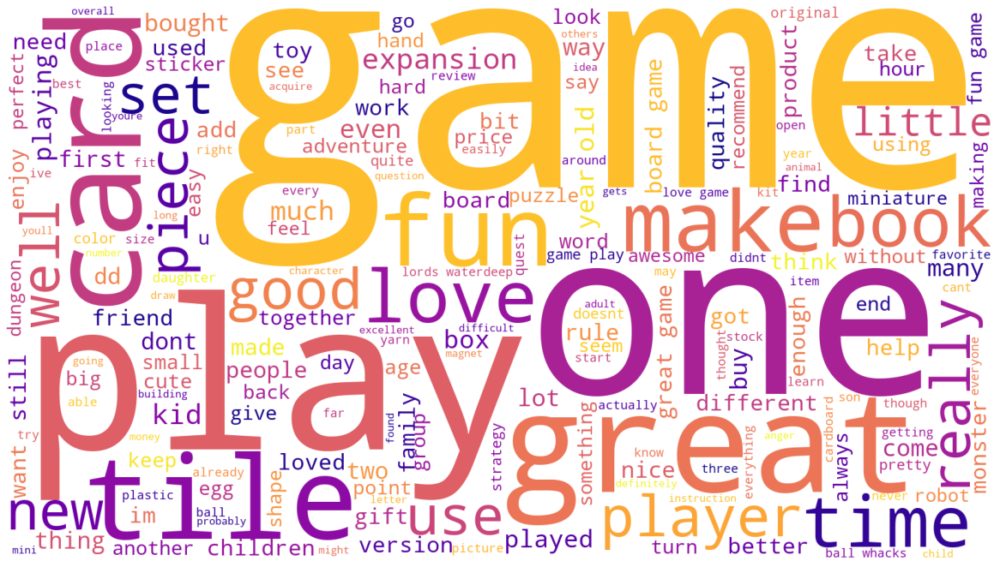

In [163]:
# Create a wordcloud without stop words for 'review' column.
wordcloud_a = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(review_tokens1_string_a) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud_a) 
plt.axis('off') 
plt.tight_layout(pad = 0) 

# Save plot as JPG image.
plt.savefig('cloud_r.jpg', dpi=144)

plt.show()

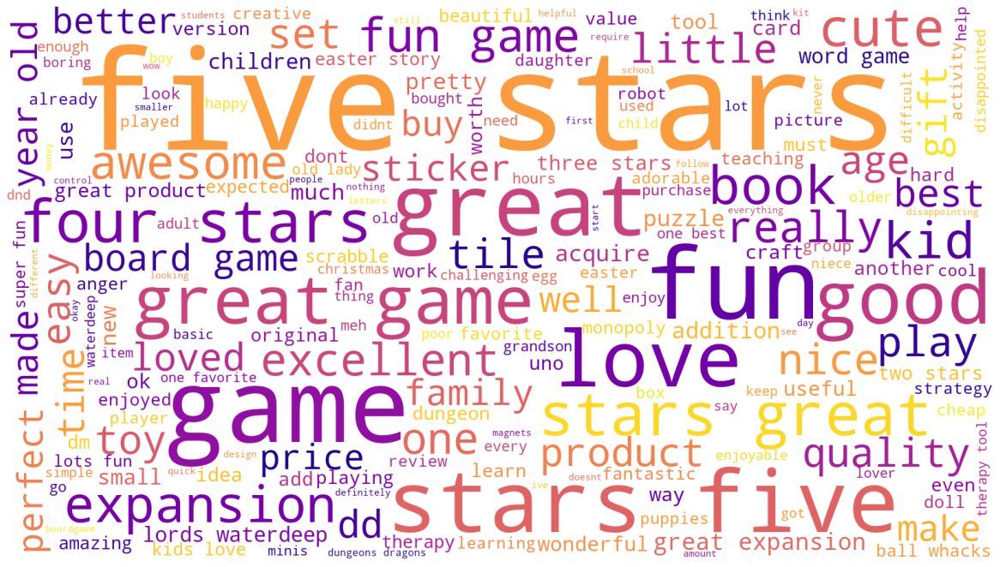

In [164]:
# Create a wordcloud without stop words for 'summary' column.
wordcloud_a = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(summary_tokens1_string_a) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud_a) 
plt.axis('off') 
plt.tight_layout(pad = 0) 

# Save plot as JPG image.
plt.savefig('cloud_s.jpg', dpi=144)

plt.show()

In [165]:
# Determine the 15 most common words from 'review' column after removing duplicates, non-alphanumeric characters 
# and stopwords.
Counter(review_tokens1_a).most_common(15)

[('game', 1685),
 ('great', 596),
 ('fun', 553),
 ('one', 530),
 ('play', 502),
 ('like', 414),
 ('love', 331),
 ('really', 319),
 ('get', 319),
 ('cards', 301),
 ('tiles', 297),
 ('good', 294),
 ('time', 291),
 ('would', 280),
 ('book', 273)]

In [166]:
# Generate a DataFrame from Counter (for 15 most common words in the 'review' column).
counts_review_a = pd.DataFrame(Counter(review_tokens1_a).most_common(15),
                             columns=['Word', 'Frequency'])

# Preview data.
counts_review_a

,Word,Frequency
0,game,1685
1,great,596
2,fun,553
3,one,530
4,play,502
5,like,414
6,love,331
7,really,319
8,get,319
9,cards,301


In [167]:
# Use generate_polarity function to extract a polarity score.

# Populate a new column with polarity scores for each of the 15 most common words identified in the 'review' column.
counts_review_a['Polarity'] = counts_review_a['Word'].apply(generate_polarity)

# Preview the result.
print(counts_review_a.describe())
counts_review_a

         Frequency   Polarity
count    15.000000  15.000000
mean    465.666667   0.140000
std     355.347650   0.313506
min     273.000000  -0.400000
25%     295.500000   0.000000
50%     319.000000   0.000000
75%     516.000000   0.250000
max    1685.000000   0.800000


,Word,Frequency,Polarity
0,game,1685,-0.4
1,great,596,0.8
2,fun,553,0.3
3,one,530,0.0
4,play,502,0.0
5,like,414,0.0
6,love,331,0.5
7,really,319,0.2
8,get,319,0.0
9,cards,301,0.0


In [168]:
# Export above DataFrame as CSV file.
counts_review_a.to_csv('word_count_r.csv')

In [169]:
# Determine the 15 most common words from 'summary' column after removing duplicates, non-alphanumeric characters 
# and stopwords.
Counter(summary_tokens1_a).most_common(15)

[('stars', 466),
 ('five', 381),
 ('game', 319),
 ('great', 295),
 ('fun', 218),
 ('love', 93),
 ('good', 92),
 ('four', 58),
 ('like', 54),
 ('expansion', 52),
 ('kids', 50),
 ('cute', 45),
 ('book', 43),
 ('one', 38),
 ('awesome', 36)]

In [170]:
# Generate a DataFrame from Counter (for 15 most common words in the 'summary' column).
counts_summary_a = pd.DataFrame(Counter(summary_tokens1_a).most_common(15),
                              columns=['Word', 'Frequency'])

# Preview data.
counts_summary_a

,Word,Frequency
0,stars,466
1,five,381
2,game,319
3,great,295
4,fun,218
5,love,93
6,good,92
7,four,58
8,like,54
9,expansion,52


In [171]:
# Populate a new column with polarity scores for each of the 15 most common words identified in the 'summary' column.
counts_summary_a['Polarity'] = counts_summary_a['Word'].apply(generate_polarity)

# Preview the result.
print(counts_summary_a.describe())
counts_summary_a

        Frequency   Polarity
count   15.000000  15.000000
mean   149.333333   0.226667
std    146.221782   0.388158
min     36.000000  -0.400000
25%     47.500000   0.000000
50%     58.000000   0.000000
75%    256.500000   0.500000
max    466.000000   1.000000


,Word,Frequency,Polarity
0,stars,466,0.0
1,five,381,0.0
2,game,319,-0.4
3,great,295,0.8
4,fun,218,0.3
5,love,93,0.5
6,good,92,0.7
7,four,58,0.0
8,like,54,0.0
9,expansion,52,0.0


In [172]:
# Export above DataFrame as CSV file.
counts_summary_a.to_csv('word_count_s.csv')

In [173]:
# Populate a new column with polarity scores for each review.
df3a['polarity_r'] = df3a['review'].apply(generate_polarity)

# Preview the result.
df3a['polarity_r'].head()

0   -0.036111
1    0.035952
2    0.116640
3    0.578788
4   -0.316667
Name: polarity_r, dtype: float64

In [174]:
# Get a list of all english words so we can exclude anything that doesnt appear on the list.
all_english_words = set(words.words())

# Convert tokenised 'review' column into a list which includes sub-lists of rewies devided by a word.
review_list_a = df3a_1['review'].values.tolist()

# Some pre-processing:
#-- lets get every word
#-- lets convert it to lowercase
#-- only include if the word is alphanumeric and if it is in the list of English words.
review_list1_a = [[y.lower() for y in x if y.lower() not in english_stopwords and y.isalpha() and y.lower() 
          in all_english_words] for x in review_list_a]

# Create a variable to store the sia.
sia_a = SentimentIntensityAnalyzer()

# Run through a dictionary comprehension to take every cleaned review. 
# Next run the polarity score function on the string.
# This will return four values in a dictionary.

df_polarity_a = {" ".join(_) : sia_a.polarity_scores(" ".join(_)) for _ in review_list1_a}

# Convert the list of dictionary results to a Pandas DataFrame.
# The index is the cleaned tweet.
# We can see some of the highly positive words. 
polarity_a = pd.DataFrame(df_polarity_a).T

# View the DataFrame.
polarity_a.sort_index(ascending=True)

,neg,neu,pos,compound
,0.000,0.000,0.000,0.0000
able implement easily use alongside even size outline get place tile see room theyre,0.000,0.844,0.156,0.3400
absolutely adorable excited teach daughter alphabet fun didnt receive whole alphabet,0.000,0.458,0.542,0.8581
absolutely amazing set first laid kind disappointed like build encounter amazed much actually box,0.123,0.356,0.522,0.8777
absolutely beautiful week school know love plan enjoy home thank beautifully made appreciate gently open first time,0.000,0.299,0.701,0.9735
...,...,...,...,...
younger big make easy play young feature helping learn order twenty,0.000,0.516,0.484,0.7579
youve stuff classic per minute time world devote card sleight hand book seriously truly excellent book though faint heart superb one serious serious card magic book serious get course overlook antiquated prose tremendous ego throughout read material forgive tone splendid work want best,0.088,0.474,0.438,0.9753
yr old along gave perfect project,0.000,0.575,0.425,0.5719
yr old son puzzle nice big,0.000,0.641,0.359,0.4215


In [175]:
# The describe function on the compound will show the distribution. 
# The average (mean) is 0.614441 => positive sentiment.
polarity_a['compound'].describe()

count    1893.000000
mean        0.614441
std         0.378991
min        -0.975600
25%         0.458800
50%         0.742200
75%         0.891000
max         0.998700
Name: compound, dtype: float64

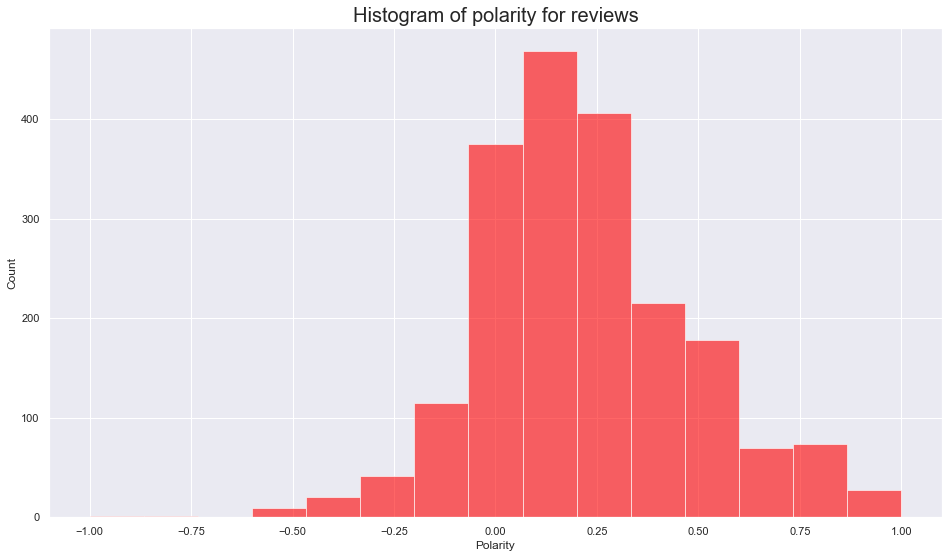

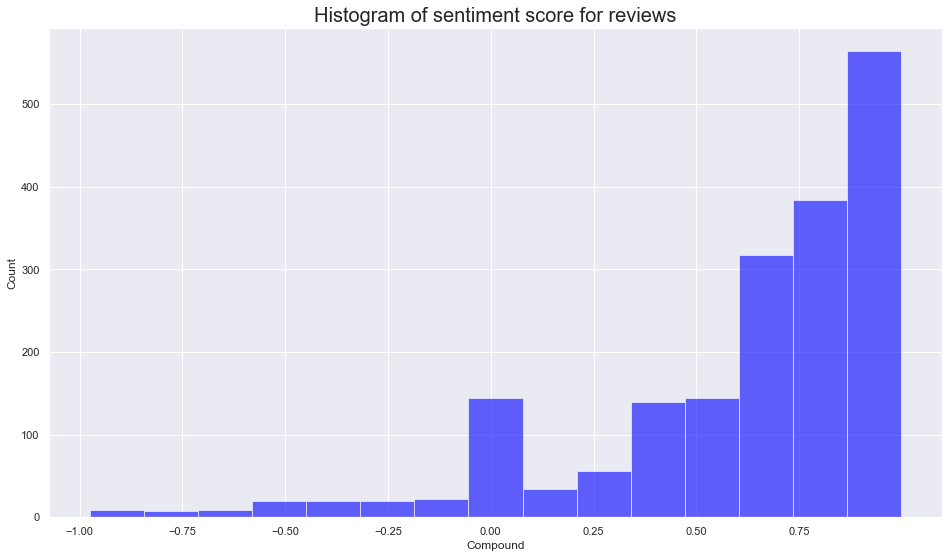

<AxesSubplot:>

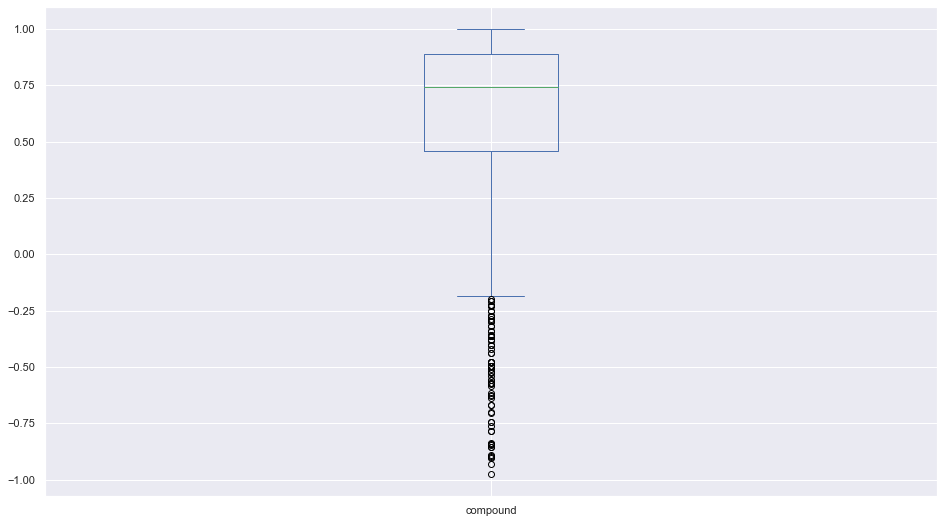

In [176]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3a['polarity_r'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of polarity for reviews', fontsize=20)

plt.show()

# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot = polarity_a.reset_index()['compound'].sort_values()

# Define the bars.
n, bins, patches = plt.hist(plot, num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Compound', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score for reviews', fontsize=20)
plt.xticks(np.arange(-1, 1, step=0.25))

plt.show()

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot.plot(kind='box', figsize=(16,9))

In [177]:
# Populate a new column with polarity scores for each summary.
df3a['polarity_s'] = df3a['summary'].apply(generate_polarity)

# Preview the result.
df3a['polarity_s'].head()

0    0.15
1   -0.80
2    0.00
3    0.00
4    0.00
Name: polarity_s, dtype: float64

In [178]:
df3a.describe()

,age,remuneration,spending_score,loyalty_points,product_code,polarity_r,polarity_s
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500,0.217688,0.219317
std,13.573212,23.123984,26.094702,1283.239705,3148.938839,0.262502,0.335627
min,17.000000,12.300000,1.000000,25.000000,107.000000,-1.000000,-1.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000,0.049888,0.000000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000,0.182258,0.062500
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000,0.361028,0.451250
max,72.000000,112.340000,99.000000,6847.000000,11086.000000,1.000000,1.000000


In [179]:
# Convert tokenised 'summary' column into a list which includes sub-lists of rewies devided by a word.
summary_list_a = df3a_1['summary'].values.tolist()

# Some pre-processing:
#-- lets get every word
#-- lets convert it to lowercase
#-- only include if the word is alphanumeric and if it is in the list of English words.
summary_list1_a = [[y.lower() for y in x if y.lower() not in english_stopwords and y.isalpha() and y.lower() 
          in all_english_words] for x in summary_list_a]

# Create a variable to store the sia.
sia_a = SentimentIntensityAnalyzer()

# Run through a dictionary comprehension to take every cleaned review. 
# Next run the polarity score function on the string.
# This will return four values in a dictionary.

df_polarity1_a = {" ".join(_) : sia_a.polarity_scores(" ".join(_)) for _ in summary_list1_a}

# Convert the list of dictionary results to a Pandas DataFrame.
# The index is the cleaned tweet.
# We can see some of the highly positive words. 
polarity1_a = pd.DataFrame(df_polarity1_a).T

# View the DataFrame.
polarity1_a.sort_index(ascending=True)

,neg,neu,pos,compound
,0.0,0.000,0.000,0.0000
aam counter offensive,0.6,0.400,0.000,-0.4588
able tell better easter week hope theyll used,0.0,0.508,0.492,0.7003
absolutely adorable excited teach daughter,0.0,0.327,0.673,0.7328
absolutely love,0.0,0.182,0.818,0.6697
...,...,...,...,...
year old sister,0.0,1.000,0.000,0.0000
yes buy wish company,0.0,0.270,0.730,0.6597
yet another dimension already good game,0.0,0.633,0.367,0.4404
young granddaughter fun,0.0,0.377,0.623,0.5106


In [180]:
# The describe function on the compound will show the distribution. 
# The average (mean) is 0.378276 => fairly positive sentiment.
polarity1_a['compound'].describe()

count    1165.000000
mean        0.378276
std         0.343531
min        -0.784500
25%         0.000000
50%         0.493900
75%         0.624900
max         0.952400
Name: compound, dtype: float64

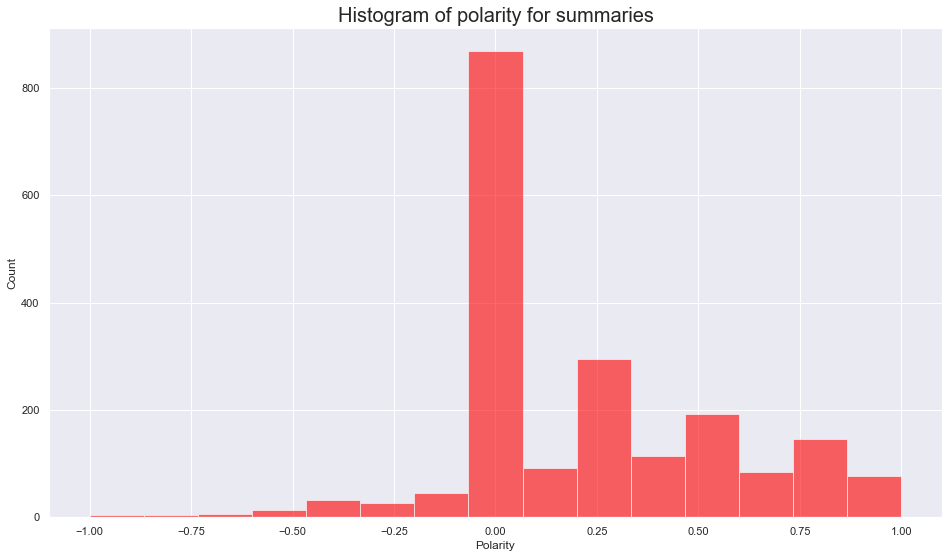

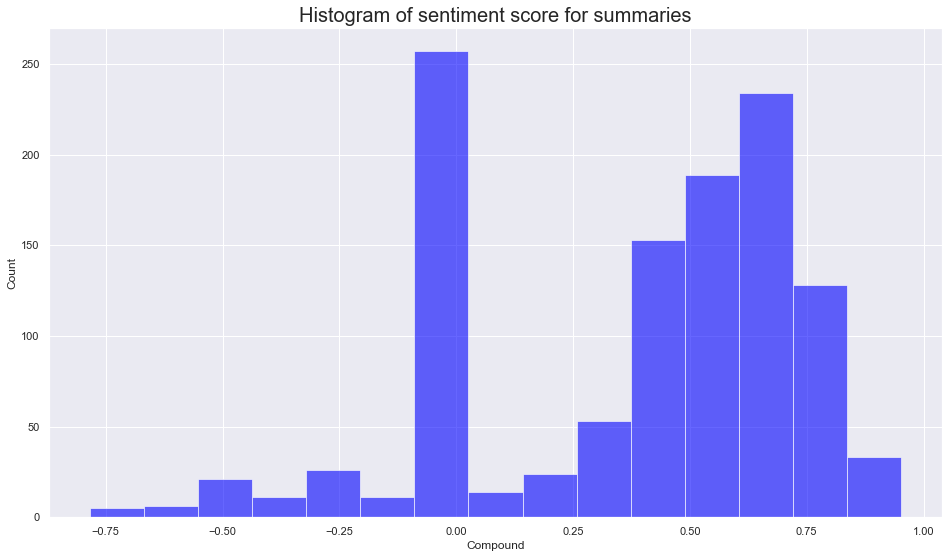

<AxesSubplot:>

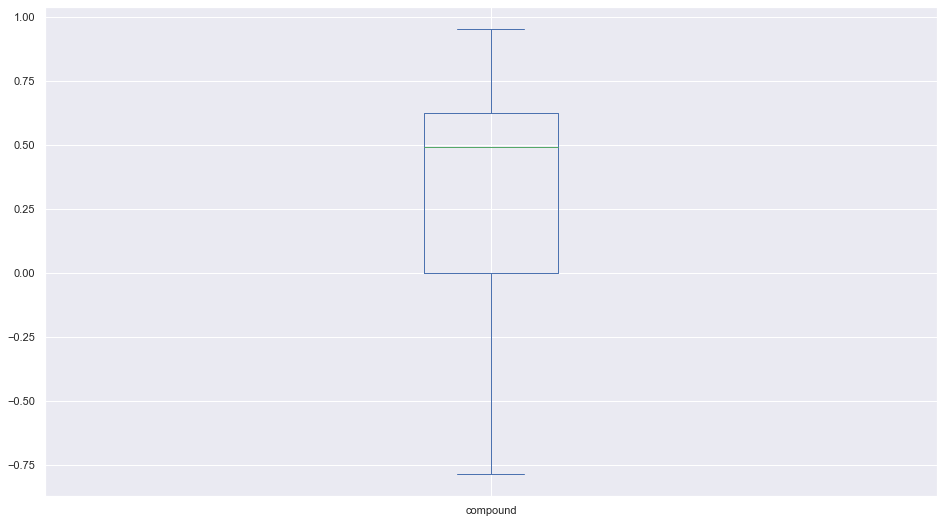

In [181]:
# Summary: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3a['polarity_s'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of polarity for summaries', fontsize=20)

plt.show()

# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot1_a = polarity1_a.reset_index()['compound'].sort_values()

# Define the bars.
n, bins, patches = plt.hist(plot1, num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Compound', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score for summaries', fontsize=20)

plt.show()

# The boxplot is a nice way to see how many values sit on the edges as outliers.
plot1.plot(kind='box', figsize=(16,9))

In [182]:
# Top 20 negative reviews.
# Create a DataFrame.
negative_sentiment_r_a = df3a.nsmallest(20, 'polarity_r')

# Eliminate unnecessary columns.
negative_sentiment_r_a = negative_sentiment_r_a[['review', 'polarity_r']]

# View output.
negative_sentiment_r_a.style.set_properties(subset=['review'], **{'width': '1200px'})

,review,polarity_r
208,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.000000
182,incomplete kit very disappointing,-0.780000
1804,im sorry i just find this product to be boring and to be frank juvenile,-0.583333
364,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.550000
117,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.500000
227,this was a gift for my daughter i found it difficult to use,-0.500000
230,i found the directions difficult,-0.500000
290,instructions are complicated to follow,-0.500000
301,difficult,-0.500000
1524,expensive for what you get,-0.500000


In [183]:
# Top 20 negative summaries.
# Create a DataFrame.
negative_sentiment_s_a = df3a.nsmallest(20, 'polarity_s')

# Eliminate unnecessary columns.
negative_sentiment_s_a = negative_sentiment_s_a[['summary', 'polarity_s']]

# View output.
negative_sentiment_s_a.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
21,the worst value ive ever seen,-1.000000
208,boring unless you are a craft person which i am,-1.000000
829,boring,-1.000000
1166,before this i hated running any rpg campaign dealing with towns because it,-0.900000
1,another worthless dungeon masters screen from galeforce9,-0.800000
144,disappointed,-0.750000
631,disappointed,-0.750000
793,disappointed,-0.750000
1620,disappointed,-0.750000
363,promotes anger instead of teaching calming methods,-0.700000


In [184]:
# View top 20 negative summaries (unique; with the lowest polarity score)
df3a_unq = df3a.drop_duplicates(subset = 'summary')

# Create a DataFrame.
negative_sentiment_s_unq = df3a_unq.nsmallest(20, 'polarity_s')

# Eliminate unnecessary columns.
negative_sentiment_s_unq = negative_sentiment_s_unq[['summary', 'polarity_s']]

# View output.
negative_sentiment_s_unq.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
21,the worst value ive ever seen,-1.000000
208,boring unless you are a craft person which i am,-1.000000
829,boring,-1.000000
1166,before this i hated running any rpg campaign dealing with towns because it,-0.900000
1,another worthless dungeon masters screen from galeforce9,-0.800000
144,disappointed,-0.750000
363,promotes anger instead of teaching calming methods,-0.700000
885,too bad this is not what i was expecting,-0.700000
890,bad qualityall made of paper,-0.700000
178,at age 31 i found these very difficult to make,-0.650000


In [185]:
# Top 20 positive reviews.
positive_sentiment_r_a = df3a.nlargest(20, 'polarity_r')

# Eliminate unnecessary columns.
positive_sentiment_r_a = positive_sentiment_r_a[['review', 'polarity_r']]

# Adjust the column width.
positive_sentiment_r_a.style.set_properties(subset=['review'], **{'width': '1200px'})

,review,polarity_r
7,came in perfect condition,1.000000
165,awesome book,1.000000
194,awesome gift,1.000000
496,excellent activity for teaching selfmanagement skills,1.000000
524,perfect just what i ordered,1.000000
591,wonderful product,1.000000
609,delightful product,1.000000
621,wonderful for my grandson to learn the resurrection story,1.000000
790,perfect,1.000000
933,awesome,1.000000


In [186]:
# View top 20 positive reviews (unique; with the highest polarity score).
df3a_unq1 = df3a.drop_duplicates(subset = 'review')

# Create a DataFrame.
positive_sentiment_r_unq = df3a_unq1.nlargest(20, 'polarity_r')

# Eliminate unnecessary columns.
positive_sentiment_r_unq = positive_sentiment_r_unq[['review', 'polarity_r']]

# Adjust the column width.
positive_sentiment_r_unq.style.set_properties(subset=['review'], **{'width': '1200px'})

,review,polarity_r
7,came in perfect condition,1.000000
165,awesome book,1.000000
194,awesome gift,1.000000
496,excellent activity for teaching selfmanagement skills,1.000000
524,perfect just what i ordered,1.000000
591,wonderful product,1.000000
609,delightful product,1.000000
621,wonderful for my grandson to learn the resurrection story,1.000000
790,perfect,1.000000
933,awesome,1.000000


In [187]:
# Top 20 positive summaries.
positive_sentiment_s_a = df3.nlargest(20, 'polarity_s')

# Eliminate unnecessary columns.
positive_sentiment_s_a = positive_sentiment_s[['summary', 'polarity_s']]

# Adjust the column width.
positive_sentiment_s_a.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
6,best gm screen ever,1.000000
28,wonderful designs,1.000000
32,perfect,1.000000
80,theyre the perfect size to keep in the car or a diaper,1.000000
133,perfect for preschooler,1.000000
139,awesome sticker activity for the price,1.000000
160,awesome book,1.000000
162,he was very happy with his gift,1.000000
186,awesome,1.000000
209,awesome and welldesigned for 9 year olds,1.000000


In [188]:
# View top 20 positive summaries (unique; with the highest polarity score).
# Create a DataFrame.
negative_sentiment_s_unq = df3a_unq.nlargest(20, 'polarity_s')

# Eliminate unnecessary columns.
negative_sentiment_s_unq = negative_sentiment_s_unq[['summary', 'polarity_s']]

# View output.
negative_sentiment_s_unq.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,polarity_s
6,best gm screen ever,1.000000
28,wonderful designs,1.000000
32,perfect,1.000000
80,theyre the perfect size to keep in the car or a diaper,1.000000
134,perfect for preschooler,1.000000
140,awesome sticker activity for the price,1.000000
161,awesome book,1.000000
163,he was very happy with his gift,1.000000
187,awesome,1.000000
210,awesome and welldesigned for 9 year olds,1.000000


In [189]:
# View observations when polarity for review column is positive but polarity for summary column is negative.
rev_pos_sum_neg = df3a[(df3a['polarity_r'] > 0) & (df3a['polarity_s'] < 0)]

# Eliminate unnecessary columns.
rev_pos_sum_neg = rev_pos_sum_neg[['review', 'summary', 'polarity_r', 'polarity_s']]

# View output.
print(rev_pos_sum_neg.shape)
rev_pos_sum_neg.style.set_properties(subset=['review', 'summary'], **{'width': '600px'})

(117, 4)


,review,summary,polarity_r,polarity_s
1,an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could have been easily reduced to a single panel in size and the few table you have are nighuseless themselves in short stop making crap dm screens,another worthless dungeon masters screen from galeforce9,0.035952,-0.800000
12,this is a campaign specific dm screen meant to work with the storm kings thunder adventure it is not a general use screen the reason im giving it 5 stars is that every named place on the map also has the page number of locations entry in tskt that feature has saved me time in adventures league play other al dms will tell you how precious every minute is in the standard 2 hour format,not a general dm screen,0.070000,-0.025000
14,it sounded like a really amazing concept but when we tried to play it it fell completely flat maybe if we were fans of the television show that the game is originally based upon but having no prior experience we tried three rounds even using the hints to get people started and everyone just looked at each other and we decided to play something else this was a high iq group and we often use puns in day to day banter but the game just fell completely flat sad because the quality of the box set is very nice and comes with everything needed to play pads pencils etc,fell completely flat,0.040000,-0.025000
21,these are cute tatoos for those who love pirates however the retail price is 150 and amazons price is more than double i have never paid over the retail price for an item at amazon i was shocked there are only a handful of tatoos and for 150 i wouldnt mind but to charge 350 for an item that sells anywhere else for 150 is criminal find it at a local drugstore and save your,the worst value ive ever seen,0.050000,-1.000000
72,this is a tiny book only a few pages of stickers the stickers dont stick very well after the first time placing them it did however entertain my son during a trip stickers for making 4 different robots all different colors i would suggest it for younger kids my son is 3,worked for a trip only a few pages,0.031250,-0.100000
77,this book is very cute but make sure you look at the size its very small dont anticipate anything large,small book,0.259821,-0.250000
97,cute little book wish there was a little more to it but cant beat it for the price,wont keep them occupied for long,0.156250,-0.050000
104,its a bit thin was expecting more there is a robot in the back and you cover him with new stickers the stickers are almost like clothes instead of actual robot parts it would be nice if there was a section of heads section of bases and torsos and you could combine them together to build unique robots you are supposed to put the stickers back in the book when you are finished i doubt that will work with my son we will see how long this lasts i am going to guess about 5 minutes,a pretty thin book of 38 stickers,0.129040,-0.075000
113,if you have a child interested in robots this is a fun activity for them it allows the child to build a robot with colorful stickers,this is a little sticker book for a little kid,0.283333,-0.187500
123,this book is small in size and probably best for 4 to 5 years old due to having to piece the robots together without knowing what a robot is my 35 year old didnt show much interest in it other than them being stickers however i saved it and he will more than likely go for it in a year or two,small sized,0.155556,-0.250000


In [190]:
# View observations when polarity for review column is negative but polarity for summary column is positive.
rev_neg_sum_pos = df3a[(df3a['polarity_r'] < 0) & (df3a['polarity_s'] > 0)]

# Eliminate unnecessary columns.
rev_neg_sum_pos = rev_neg_sum_pos[['review', 'summary', 'polarity_r', 'polarity_s']]

# View output.
print(rev_neg_sum_pos.shape)
rev_neg_sum_pos.style.set_properties(subset=['review', 'summary'], **{'width': '600px'})

(108, 4)


,review,summary,polarity_r,polarity_s
0,when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completely,the fact that 50 of this space is wasted on art and not terribly informative or needed art,-0.036111,0.150000
54,5 stars for the delivery got it in 2 days after i ordered it wow as for the coloring book itself the pages are perforated and you can see through them and your crayons pencils show through to the other side putting cardboard or a thick piece of paper in between the pages will avoid that drawings are nice and you can put them in your windows when done thus the perforated pages and thin paper,drawings are nice and you can put them in your windows when,-0.025000,0.600000
92,this little book is so cute my kids love it the cover of the book is a slick surface so you can peel the stickers off and start over again the inside of the back cover has a robot base you can use to build off of if you so choose,getting a surprising amount of use out of this little thing,-0.039583,0.256250
110,this book is probably smaller than you think only a few pages and will entertain a kid for 1030 mins depending on their imagination at less than 2 i can think of worse ways to spend money on a kid although legos are probably a better investment because everyone loves playing with legos for years and years,hey robots are cool,-0.044444,0.350000
119,but definitly not tiny book make robot with stickers that comes inside whoo whoo big deal wow faint wow thats how bad,i thought wow,-0.166667,0.100000
124,got it for my 8 year old but it was very small like only a few pages i dont even know where it is now,its ok,-0.106250,0.500000
154,the drawing instructions were good but i was disappointed to find no colored pencils in the attached part thank goodness i had purchased other drawing utensils,picture part was good but there were no pencils,-0.058333,0.700000
186,hard to put together,cute idea hard to do,-0.291667,0.104167
284,i think these might be cute if they included enough yarn my daughter and i sat down to make them we measured out enough to make a white dog and a black dog and both the white and black yarn was just shy of having enough to make one puppy so now we are headed up to the craft store to buy more yarn frustrating when you have already sat down and are ready to make your project right then,i think these might be cute if they included,-0.019929,0.500000
322,i am completely shocked by all of the positive reviews this kit is truly ridiculous i recently purchased the 4m fairyland dollies kit which was awesome and the fairies came out adorable i thought this would be similar but it was a joke i had no problem making the pompoms but once you get into having to cut the pompoms to shape them into dogs it becomes pretty much impossible and the mess is out of control if you can get anywhere close to having your pompoms look like dogs you then have to glue all of the features on with the tiny little glue tube they give you and it just a useless sticky mess to make matters worse the little accessories are made out of thin cheap paper how this could be marketed as something a child could either make or play with is beyond me so to make a long story short if you love getting pissed off making a mess and having your kid cry order this kit,perfect gift for someone you hate,-0.048760,0.100000


In [191]:
# View observations when polarity for review and summary columns is positive (call it 'true positive').
rev_pos_sum_pos = df3a[(df3a['polarity_r'] > 0) & (df3a['polarity_s'] > 0)]

# Eliminate unnecessary columns.
rev_pos_sum_pos1 = rev_pos_sum_pos[['review', 'summary', 'polarity_r', 'polarity_s']]

# View output.
print(rev_pos_sum_pos1.shape)
rev_pos_sum_pos1.style.set_properties(subset=['review', 'summary'], **{'width': '600px'})

(930, 4)


,review,summary,polarity_r,polarity_s
6,i have bought many gm screens over the years but this one is the best i have ever seen it has all the relevant information i need and no crap filler on it very happy with this screen,best gm screen ever,0.660000,1.000000
8,could be better but its still great i love the things on the dms side of the screen and i actually like the map in the middle makes it easy to reference whats around at any given time,great but could be even better,0.372222,0.650000
16,pretty good book with a variety of unique card sleights palming manipulating cards in the deck etc these sleights are the real work so it will take a little perseverance many of these utility sleights are ones that you ought to know if you want to be a card sleightofhand worker the instructions are generally clear but sometimes a detail here and there gets a little confusing theres a fair number of photos showing how to do many of the sleights sometimes a sleight is a little more complicated than it needs to be my recommendation is to follow the authors steps in slowmotion with a deck of cards in hand after you are familiar with the overall effect you can make adjustments based on what your comfortable with there may also be other newer methods for learning these sleights if you want to invest in newer card sleight instruction such as the daryl encyclopedia of card sleights videos etc right now im working on the side steal sleight he gives a t nelson downs version which has some merit but it is much more complicated than necessary the authors own version is a little more doable but even the authors method becomes a little too fidgety so ive made minor modifications to make it work well for me i start in slowmotion counting through the substeps to keep pace while i do the move 1234 then i repeat it until i can bring it up to full speed if you want to learn sleights for cheap try this book you may have to pick and choose through the sleights and there may be better methods to perform some of these sleights now but its not bad for under 10,good book,0.177288,0.700000
18,if youve mastered hugard and braues stuff if you can do 60 classic passes per minute if you have all the time in the world to devote to card sleight of hand then this is the book for you seriously this is a truly excellent book buckleys sleights though not for the faint of heart are superb he mustve been one heckuva cardician this is a serious serious card magic book but if you are serious yourself youll get it of course youll overlook the antiquated prose and buckleys tremendous ego throughout when you read this material youll forgive buckleys selfcongratulatory tone this is a splendid work for those who want to be the best,very advanced but as good as it gets,0.250000,0.610000
19,ive yet to see a bad review for this book and theres a reason this book is terrific there is however one issue to be addressed this book is hard definitely not for beginners it has some of what i believe are the greatest but hardest card manipulations out there i definitely recommend it however to the serious card magic enthusiast there are enough valuable ideas in here to last you a lifetime,you better know what youre getting into,0.017500,0.500000
23,there are only few tatoos so in one week they are gone it could be better if there were more so they can share with brothers or friends the alternative is to buy like 4 or 5 of these so the kid doesnt get upset when they are gone to quick also with one bath they are gone so they dont last enough like other tatoos 2 to 5 days,good product but,0.126042,0.700000
24,id buy again as a gift for a young kid obsessed with pirates however i never actually had any handson time with the tattoos the tattoos reminded me of my favorite cracker jack prize,temporary tattoos were good gift,0.025000,0.700000
25,my young son was thrilled to have tattoos just like a real pirate these are easy to use and remove i great find,huge hit,0.426667,0.400000
26,gorgeous i love 

In [192]:
# View observations when polarity for review and summary columns is negative (call it 'true negative').
rev_neg_sum_neg = df3a[(df3a['polarity_r'] < 0) & (df3a['polarity_s'] < 0)]

# Eliminate unnecessary columns.
rev_neg_sum_neg1 = rev_neg_sum_neg[['review', 'summary', 'polarity_r', 'polarity_s']]

# View output.
print(rev_neg_sum_neg1.shape)
rev_neg_sum_neg1.style.set_properties(subset=['review', 'summary'], **{'width': '600px'})

(72, 4)


,review,summary,polarity_r,polarity_s
13,this is one of the worst games i have ever played you basically have to come up with puns on the spot not only are puns generally pretty bad you have to generate puns that are worse than your run of the mill groaners i cant imagine many people enjoying it but it is slow paced and generally does not generate any level of enjoyment unless youre very skilled with the english language,very weak game,-0.040909,-0.443750
75,they were ok but not really considered it a book really small disappointed,really small disappointed,-0.150000,-0.500000
101,the book is only 4 pages and its about the size of a 3x5 note card not much fun at all,small and boring,-0.075000,-0.625000
173,horrible nothing more to say would give zero stars if possible,horrible nothing more to say would give zero stars,-0.166667,-0.250000
178,at age 31 i found these very difficult to make i cant imagine how an 8 year old would do it by themselves,at age 31 i found these very difficult to make,-0.275000,-0.650000
208,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,boring unless you are a craft person which i am,-1.000000,-1.000000
246,the instructions were a little tricky to understand and there werent quite enough materials included to make some of the dogs,the instructions were a little tricky to understand and,-0.093750,-0.187500
247,its really annoying because when you click the pink things together it wont stay together so it broke our border collie also they dont give you enough yarn to make the chihuahua so all we could do is us the practice ball,its really annoying because when you click the pink things together it,-0.250000,-0.450000
270,i bought this for an adult crafter while she didnt have problems making the pompoms she didnt have enough yarn to make even one dog im a really big fan of klutz and im disappointed by this kit,not enough yarn,-0.150000,-0.050000
273,cute idea horrible execution if you want your child in tears then this is your book my seven year old got very frustrated with this whole thing,frustrating,-0.222000,-0.400000


In [193]:
# Print number of unique products in true positive data set.
print('Number of unique products in true positive data set:', len(rev_pos_sum_pos['product_code'].unique()), 
      'out of total unique products:', len(df3a['product_code'].unique()))


# View frequency of unique products mentioned in the true positive data set. 
rev_pos_sum_pos_unq = rev_pos_sum_pos['product_code'].value_counts().rename_axis('product_code').\
reset_index(name='count')

rev_pos_sum_pos_unq

Number of unique products in true positive data set: 200 out of total unique products: 200


,product_code,count
0,7373,9
1,249,9
2,3885,9
3,979,8
4,2286,8
...,...,...
195,2285,1
196,7143,1
197,11056,1
198,6720,1


In [194]:
# Display records where the count is larger than 6.
rev_pos_sum_pos_unq6 = rev_pos_sum_pos_unq[rev_pos_sum_pos_unq['count']>6]

rev_pos_sum_pos_unq6

,product_code,count
0,7373,9
1,249,9
2,3885,9
3,979,8
4,2286,8
5,5453,8
6,1012,8
7,9596,7
8,9612,7
9,326,7


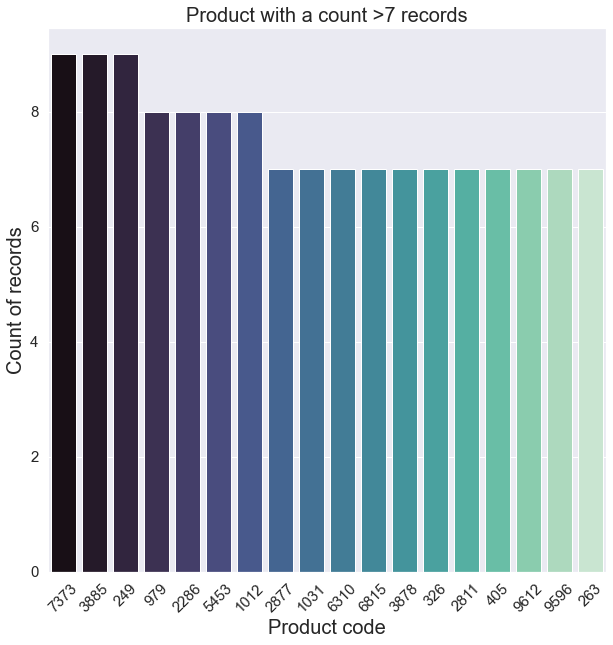

In [195]:
# Create a Seaborn barplot indicating records with a count >6 records.
barplot = sns.barplot(x='product_code', y='count', data=rev_pos_sum_pos_unq6, palette='mako',
                     order=rev_pos_sum_pos_unq6.sort_values('count',ascending = False).product_code)

# Update title, x and y labels.
barplot.set_title('Product with a count >7 records', fontdict={'fontsize':20})
barplot.set_xlabel('Product code', fontdict={'fontsize':20})
barplot.set_ylabel('Count of records', fontdict={'fontsize':20})
plt.xticks(rotation=45, size=15)
plt.yticks(size=15)

# Save plot as JPG image.
plt.savefig('top_pos.jpg', dpi=144)

# View plot.
plt.show()

In [196]:
# Print number of unique products in true negative data set.
print('Number of unique products in true negative data set:', len(rev_neg_sum_neg['product_code'].unique()), 
      'out of total unique products:', len(df3a['product_code'].unique()))


# View frequency of unique products mentioned in the true positive data set. 
rev_neg_sum_neg_unq = rev_neg_sum_neg['product_code'].value_counts().rename_axis('product_code').\
reset_index(name='count')

rev_neg_sum_neg_unq

Number of unique products in true negative data set: 61 out of total unique products: 200


,product_code,count
0,9597,2
1,2285,2
2,486,2
3,760,2
4,876,2
...,...,...
56,9150,1
57,977,1
58,9612,1
59,8933,1


In [197]:
# Display records where the count is larger than 1.
rev_neg_sum_neg_unq2 = rev_neg_sum_neg_unq[rev_neg_sum_neg_unq['count']>1]

# Sort values by product code.
rev_neg_sum_neg_unq2 = rev_neg_sum_neg_unq2.sort_values('product_code').reset_index(drop=True)

# View DataFrame.
rev_neg_sum_neg_unq2

,product_code,count
0,486,2
1,518,2
2,760,2
3,876,2
4,2285,2
5,2870,2
6,3436,2
7,3524,2
8,3967,2
9,6233,2


In [198]:
# Export above DataFrame as CSV file.
rev_neg_sum_neg_unq2.to_csv('Top_true_neg.csv')

In [199]:
# View if it is an intersect between top products in true positive and negative data sets.
pd.merge(rev_neg_sum_neg_unq2, rev_pos_sum_pos_unq6, on='product_code', how='inner')

,product_code,count_x,count_y


In [200]:
# Add clusters identified earlier to the 'true negative' data set.
rev_neg_sum_neg_km = pd.merge(rev_neg_sum_neg, x_final, left_index=True, right_index=True)

# Eliminate unnecessary columns.
rev_neg_sum_neg_km = rev_neg_sum_neg_km[['gender_x', 'age_x', 'remuneration_x', 'spending_score_x', 
                                         'loyalty_points_x', 'education_x', 'product_code', 'review', 'summary', 
                                         'polarity_r', 'polarity_s', 'K-Means Predicted']]

# View DataFrame.
rev_neg_sum_neg_km

,gender_x,age_x,remuneration_x,spending_score_x,loyalty_points_x,education_x,product_code,review,summary,polarity_r,polarity_s,K-Means Predicted
13,Female,26,16.40,77,721,graduate,1501,this is one of the worst games i have ever pla...,very weak game,-0.040909,-0.443750,4
75,Male,28,44.28,54,1430,graduate,9612,they were ok but not really considered it a bo...,really small disappointed,-0.150000,-0.500000,0
101,Female,49,50.84,48,1809,graduate,3524,the book is only 4 pages and its about the siz...,small and boring,-0.075000,-0.625000,0
173,Male,38,71.34,92,4588,graduate,5740,horrible nothing more to say would give zero s...,horrible nothing more to say would give zero s...,-0.166667,-0.250000,1
178,Male,58,76.26,14,772,diploma,7143,at age 31 i found these very difficult to make...,at age 31 i found these very difficult to make,-0.275000,-0.650000,2
...,...,...,...,...,...,...,...,...,...,...,...,...
1804,Female,33,13.12,77,663,graduate,2253,im sorry i just find this product to be boring...,disappointing,-0.583333,-0.600000,4
1832,Male,52,24.60,73,1330,PhD,876,delivery was prompt fun game,fun game,-0.050000,-0.050000,4
1833,Male,17,27.06,4,45,PhD,4459,fun family game,fun family game,-0.050000,-0.050000,3
1873,Female,62,12.30,81,696,graduate,3524,a very useful addition to the quddler game tak...,a very useful addition to the quddler game,-0.136667,-0.005000,4


In [201]:
# View how many customers per cluster are present in data set.
rev_neg_sum_neg_km['K-Means Predicted'].value_counts()

0    32
4    12
1    12
2    10
3     6
Name: K-Means Predicted, dtype: int64

In [202]:
# View descriprive statistics of the data set.
rev_neg_sum_neg_km.describe()

,age_x,remuneration_x,spending_score_x,loyalty_points_x,product_code,polarity_r,polarity_s,K-Means Predicted
count,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000
mean,40.361111,46.865278,52.111111,1631.583333,4094.208333,-0.150059,-0.307610,1.361111
std,14.639620,23.148822,24.762281,1399.937179,3185.315373,0.157015,0.236408,1.522651
min,17.000000,12.300000,1.000000,31.000000,107.000000,-1.000000,-1.000000,0.000000
25%,29.000000,31.570000,41.750000,772.000000,1462.000000,-0.198958,-0.445312,0.000000
50%,38.000000,44.280000,55.000000,1299.500000,3300.500000,-0.099826,-0.243333,1.000000
75%,49.000000,63.960000,73.000000,1704.000000,6340.250000,-0.049948,-0.116667,2.250000
max,72.000000,98.400000,93.000000,5895.000000,11056.000000,-0.008854,-0.005000,4.000000


In [203]:
# View how many customers per cluster are present in data set.
rev_neg_sum_neg_km['gender_x'].value_counts()

Female    36
Male      36
Name: gender_x, dtype: int64

In [204]:
# Add clusters identified earlier to the 'true positive' data set.
rev_pos_sum_pos_km = pd.merge(rev_pos_sum_pos, x_final, left_index=True, right_index=True)

# Eliminate unnecessary columns.
rev_pos_sum_pos_km = rev_pos_sum_pos_km[['gender_x', 'age_x', 'remuneration_x', 'spending_score_x', 
                                         'loyalty_points_x', 'education_x', 'product_code', 'review', 'summary', 
                                         'polarity_r', 'polarity_s', 'K-Means Predicted']]

# View DataFrame.
rev_pos_sum_pos_km

,gender_x,age_x,remuneration_x,spending_score_x,loyalty_points_x,education_x,product_code,review,summary,polarity_r,polarity_s,K-Means Predicted
6,Female,37,14.76,6,61,diploma,979,i have bought many gm screens over the years b...,best gm screen ever,0.660000,1.000000,3
8,Male,66,15.58,3,31,PhD,1031,could be better but its still great i love the...,great but could be even better,0.372222,0.650000,3
16,Female,37,17.22,35,417,graduate,486,pretty good book with a variety of unique card...,good book,0.177288,0.700000,3
18,Male,51,18.86,29,406,diploma,1175,if youve mastered hugard and braues stuff if y...,very advanced but as good as it gets,0.250000,0.610000,3
19,Female,37,18.86,98,1278,postgraduate,1183,ive yet to see a bad review for this book and ...,you better know what youre getting into,0.017500,0.500000,4
...,...,...,...,...,...,...,...,...,...,...,...,...
1992,Male,35,84.46,17,969,PhD,254,great game to keep the mind active we play it ...,great game to keep the mind active,0.155208,0.088889,2
1994,Female,45,84.46,23,1427,graduate,291,we are retired and find this a great way to st...,a great mind game,0.400000,0.200000,2
1995,Female,37,84.46,69,4031,PhD,977,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom,0.168750,0.200000,1
1996,Female,43,92.66,8,539,PhD,979,great game did not think i would like it when ...,super fun,0.158333,0.316667,2


In [205]:
# View how many customers per cluster are present in data set.
rev_pos_sum_pos_km['K-Means Predicted'].value_counts()

0    349
1    165
2    161
4    128
3    127
Name: K-Means Predicted, dtype: int64

In [206]:
# View descriprive statistics of the data set.
rev_pos_sum_pos_km.describe()

,age_x,remuneration_x,spending_score_x,loyalty_points_x,product_code,polarity_r,polarity_s,K-Means Predicted
count,930.000000,930.000000,930.000000,930.000000,930.00000,9.300000e+02,930.000000,930.000000
mean,39.374194,47.816581,50.275269,1578.182796,4224.35914,2.647179e-01,0.467585,1.483871
std,13.451495,23.100638,26.045905,1286.716941,3110.11297,1.875529e-01,0.269177,1.449642
min,17.000000,12.300000,1.000000,31.000000,107.00000,1.387779e-17,0.004167,0.000000
25%,29.000000,30.340000,32.000000,830.000000,1581.00000,1.197372e-01,0.250595,0.000000
50%,38.000000,44.280000,50.000000,1272.000000,3547.00000,2.197403e-01,0.433333,1.000000
75%,49.000000,63.960000,73.000000,1681.000000,6504.00000,3.677083e-01,0.700000,3.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.00000,1.000000e+00,1.000000,4.000000


In [207]:
# View how many customers per cluster are present in data set.
rev_pos_sum_pos_km['gender_x'].value_counts()

Female    530
Male      400
Name: gender_x, dtype: int64

## 7. Discuss: Insights and observations

**The data was analysed using NLP with and without removing duplicates in review and summary columns. The output did not change significantly but I do not think it is necessary to remove duplicates. When we take into consideration values in other columns (not only in review and summary columns) we can see that all observations are unique. It also allows us to do more in-depth analysis.**

**I've used Textblob pre-trained inbuilt classifier and VADER (Valence Aware Dictionary and sEntiment Reasoner) lexicon and rule-based sentiment analysis tool for the sentiment analysis of review and summary columns. Outputs of both analysis were overall positive for both columns (Textblob (mean): 0.217688 for reviews; 0.226667 for summaries. VADER (mean): 0.614441 for reviews; 0.378276 for summaries).**

**Textblob:**

225 observations (11.25%) have inconsistency between polarity score signs for review and summary columns (positive polarity score for review column and negative polarity score for summary column or vice versa). *Nutral scores were not taken into consideration.*

72 observations (3.6%) have negative polarity score for review and summary columns and were marked as 'true negative'.

930 observations (46.5%) have positive polarity score for review and summary columns and were marked as 'true positive'.

61 products (30.5% of all products in the original data set) were mentioned in 'true negative' data set. 11 products were mentioned the most (twice). 

200 products (100% of all products in the original data set) 'true positive' data set. 18 products were mentioned the most (7-9 times). 

44.44% of all customers in 'true negative' data set belong to cluster 0 followed by cluster 4 and cluster 1 (16.67% each) => have spending score from middle-high bracket (40-99). It is equal amount of male and female customers in this data set. 

37.53% of all customers in 'true positive' data set belong to cluster 0 followed by cluster 1 (17.74%) and cluster 2 (17.31% each) => have spendings from middle-high remuneration bracket (£31.98k-£112.34k). 56.99% of female customers is present in this data set. 

**I've also identified:**

- the 15 most common words used in online product reviews;
- the 15 most common words used in online product summaries;
- the top 20 positive reviews and the top 20 negative reviews received from the website;
- the top 20 positive summaries and the top 20 negative summaries received from the website.

# 